<h4>Problem Statement</h4?

Houses are one of the necessary need of each and every person around the globe and therefore housing and real estate market is one of the markets which is one of the major contributors in the world’s economy. It is a very large market and there are various companies working in the domain. Data science comes as a very important tool to solve problems in the domain to help the companies increase their overall revenue, profits, improving their marketing strategies and focusing on changing trends in house sales and purchases. Predictive modelling, Market mix modelling, recommendation systems are some of the machine learning techniques used for achieving the business goals for housing companies. Our problem is related to one such housing company.

A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file below.

The company is looking at prospective properties to buy houses to enter the market. You are required to build a model using Machine Learning in order to predict the actual value of the prospective properties and decide whether to invest in them or not. For this company wants to know:

• Which variables are important to predict the price of variable?

• How do these variables describe the price of the house?

In [1]:
#importing libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
#reading the data
train = pd.read_csv("housing/train.csv")
test = pd.read_csv("housing/test.csv")
pd.set_option("display.max_columns", None)

In [3]:
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,127,120,RL,NaN,4928,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6,5,1976,1976,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,ALQ,120,Unf,0,958,1078,GasA,TA,Y,SBrkr,958,0,0,958,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1977.0,RFn,2,440,TA,TA,Y,0,205,0,0,0,0,NaN,NaN,NaN,0,2,2007,WD,Normal,128000
1,889,20,RL,95.0,15865,Pave,NaN,IR1,Lvl,AllPub,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8,6,1970,1970,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.0,Gd,Gd,PConc,TA,Gd,Gd,ALQ,351,Rec,823,1043,2217,GasA,Ex,Y,SBrkr,2217,0,0,2217,1,0,2,0,4,1,Gd,8,Typ,1,TA,Attchd,1970.0,Unf,2,621,TA,TA,Y,81,207,0,0,224,0,NaN,NaN,NaN,0,10,2007,WD,Normal,268000
2,793,60,RL,92.0,9920,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,GLQ,862,Unf,0,255,1117,GasA,Ex,Y,SBrkr,1127,886,0,2013,1,0,2,1,3,1,TA,8,Typ,1,TA,Attchd,1997.0,Unf,2,455,TA,TA,Y,180,130,0,0,0,0,NaN,NaN,NaN,0,6,2007,WD,Normal,269790
3,110,20,RL,105.0,11751,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1977,1977,Hip,CompShg,Plywood,Plywood,BrkFace,480.0,TA,TA,CBlock,Gd,TA,No,BLQ,705,Unf,0,1139,1844,GasA,Ex,Y,SBrkr,1844,0,0,1844,0,0,2,0,3,1,TA,7,Typ,1,TA,Attchd,1977.0,RFn,2,546,TA,TA,Y,0,122,0,0,0,0,NaN,MnPrv,NaN,0,1,2010,COD,Normal,190000
4,422,20,RL,NaN,16635,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,7,1977,2000,Gable,CompShg,CemntBd,CmentBd,Stone,126.0,Gd,TA,CBlock,Gd,TA,No,ALQ,1246,Unf,0,356,1602,GasA,Gd,Y,SBrkr,1602,0,0,1602,0,1,2,0,3,1,Gd,8,Typ,1,TA,Attchd,1977.0,Fin,2,529,TA,TA,Y,240,0,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal,215000


In [4]:
test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,337,20,RL,86.0,14157,Pave,NaN,IR1,HLS,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,5,2005,2006,Hip,CompShg,VinylSd,VinylSd,Stone,200.0,Gd,TA,PConc,Ex,TA,Gd,GLQ,1249,Unf,0,673,1922,GasA,Ex,Y,SBrkr,1922,0,0,1922,1,0,2,0,3,1,Gd,8,Typ,1,Gd,Attchd,2005.0,Fin,3,676,TA,TA,Y,178,51,0,0,0,0,NaN,NaN,NaN,0,7,2007,WD,Normal
1,1018,120,RL,NaN,5814,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,CBlock,Gd,TA,Av,GLQ,1036,Unf,0,184,1220,GasA,Gd,Y,SBrkr,1360,0,0,1360,1,0,1,0,1,1,Gd,4,Typ,1,Ex,Attchd,1984.0,RFn,2,565,TA,TA,Y,63,0,0,0,0,0,NaN,NaN,NaN,0,8,2009,COD,Abnorml
2,929,20,RL,NaN,11838,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,8,5,2001,2001,Hip,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,Av,Unf,0,Unf,0,1753,1753,GasA,Ex,Y,SBrkr,1788,0,0,1788,0,0,2,0,3,1,Ex,7,Typ,1,TA,Attchd,2001.0,RFn,2,522,TA,TA,Y,202,151,0,0,0,0,NaN,NaN,NaN,0,6,2009,WD,Normal
3,1148,70,RL,75.0,12000,Pave,NaN,Reg,Bnk,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,7,1941,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,275,Unf,0,429,704,GasA,Ex,Y,SBrkr,860,704,0,1564,0,0,1,1,3,1,Fa,7,Typ,1,Gd,Attchd,1941.0,Unf,1,234,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2009,WD,Normal
4,1227,60,RL,86.0,14598,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Somerst,Feedr,Norm,1Fam,2Story,6,5,2007,2007,Gable,CompShg,VinylSd,VinylSd,Stone,74.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,894,894,GasA,Ex,Y,SBrkr,894,1039,0,1933,0,0,2,1,4,1,Gd,9,Typ,1,Gd,BuiltIn,2007.0,Fin,3,668,TA,TA,Y,100,18,0,0,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal


In [5]:
train.shape, test.shape

((1168, 81), (292, 80))

In [6]:
#checking the column names
train.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [7]:
#checking datatypes
train.dtypes

Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
                  ...   
MoSold             int64
YrSold             int64
SaleType          object
SaleCondition     object
SalePrice          int64
Length: 81, dtype: object

In [8]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    954 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          77 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

In [9]:
print(train["Alley"].isnull().sum())
print(train["MiscFeature"].isnull().sum())
print(train["PoolQC"].isnull().sum())
print(train["Fence"].isnull().sum())

1091
1124
1161
931


In [10]:
#droping the columns containing less data
train.drop(["Id", "Alley", "MiscFeature", "PoolQC", "Fence"], inplace=True, axis=1)

In [11]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1168 non-null   int64  
 1   MSZoning       1168 non-null   object 
 2   LotFrontage    954 non-null    float64
 3   LotArea        1168 non-null   int64  
 4   Street         1168 non-null   object 
 5   LotShape       1168 non-null   object 
 6   LandContour    1168 non-null   object 
 7   Utilities      1168 non-null   object 
 8   LotConfig      1168 non-null   object 
 9   LandSlope      1168 non-null   object 
 10  Neighborhood   1168 non-null   object 
 11  Condition1     1168 non-null   object 
 12  Condition2     1168 non-null   object 
 13  BldgType       1168 non-null   object 
 14  HouseStyle     1168 non-null   object 
 15  OverallQual    1168 non-null   int64  
 16  OverallCond    1168 non-null   int64  
 17  YearBuilt      1168 non-null   int64  
 18  YearRemo

In [12]:
#finding upper and lower limits of outliers
def out_limits(column):
    q3,q1 = np.nanpercentile(column, [75,25])
    iqr = q3 - q1
    ul = q3 + 1.5 * iqr
    ll = q1 - 1.5 * iqr
    return ul, ll

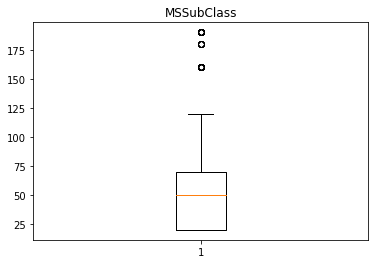

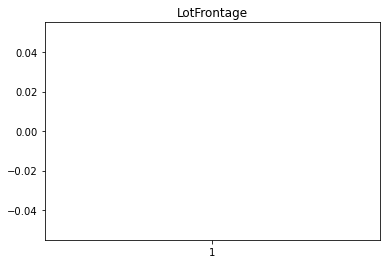

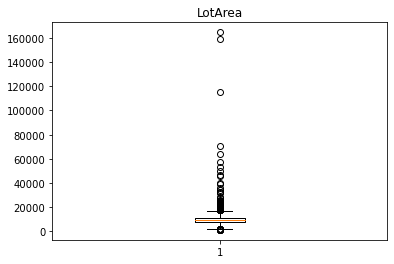

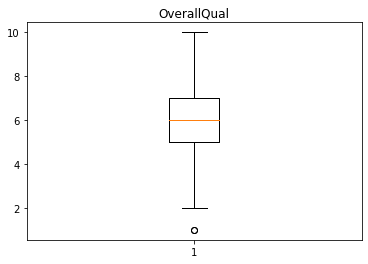

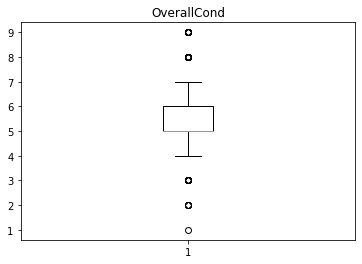

...

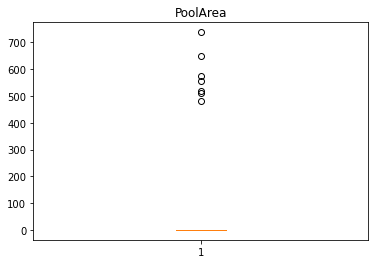

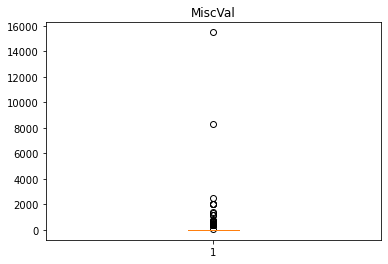

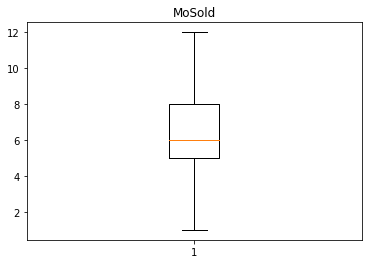

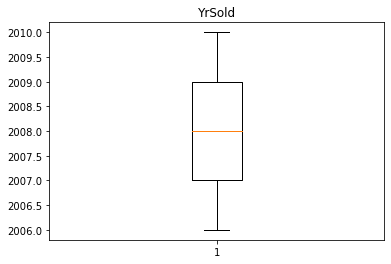

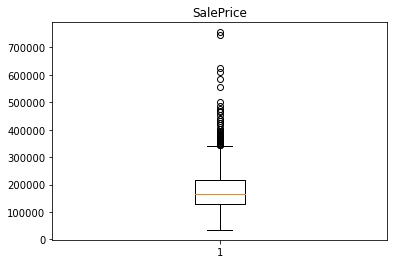

In [13]:

#checking the numerical columns
for i,column in enumerate(train.columns):
    if train[column].dtype != "object":
        plt.boxplot(train[column])
        plt.title(column)
        plt.savefig("housing/box"+str(i)+".png")
        plt.show()

In [14]:
#replace the outlier values with nan values
for column in train.columns:
    if train[column].dtype != "object":
        if column != "SalePrice":
            ul, ll = out_limits(train[column])
            train[column] = np.where((train[column] > ul)|(train[column] < ll), np.nan, train[column])

In [15]:
#replacing nan values with median and mode
for column in train.columns:
    if train[column].dtype != "object":
        train[column].replace(np.nan, train[column].median(), inplace=True)
    else:
        train[column].replace(np.nan, train[column].mode(), inplace=True)

In [16]:
train.isnull().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
                ..
MoSold           0
YrSold           0
SaleType         0
SaleCondition    0
SalePrice        0
Length: 76, dtype: int64

In [17]:
#finding the categorical column which do not have more than one value
for column in train.columns:
    if train[column].dtype == "object":
        if  train[column].value_counts().count() == 1:
            print(column)

Utilities


In [18]:
#so we can drop Utlities column
train.drop(["Utilities"], axis=1, inplace=True)

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


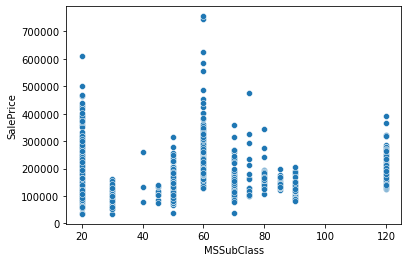

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


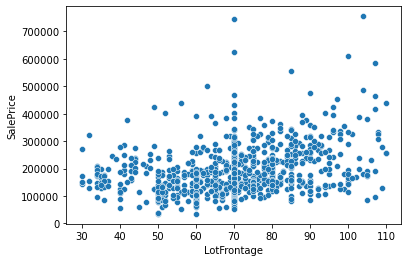

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


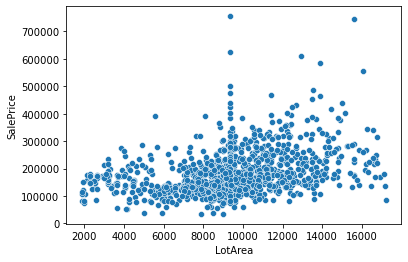

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


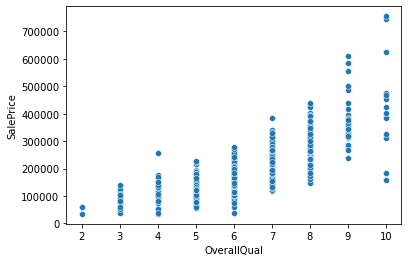

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


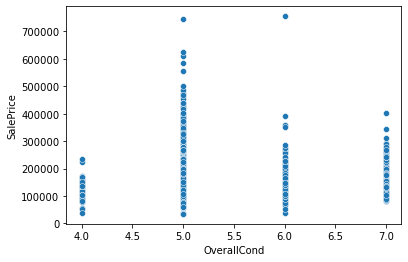

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


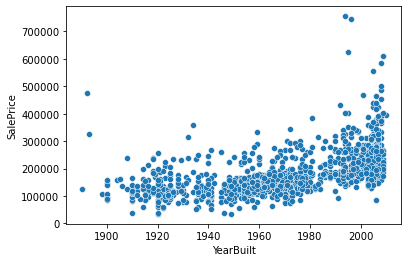

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


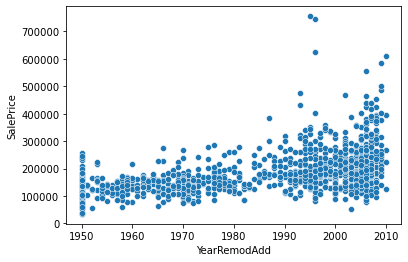

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


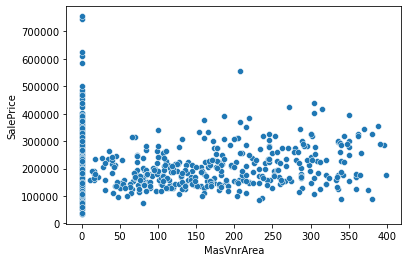

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


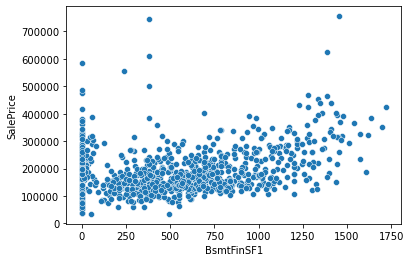

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


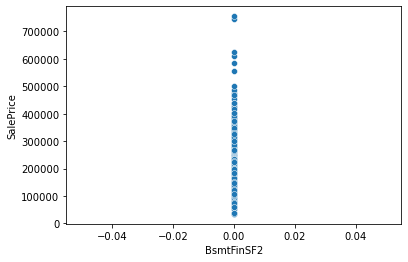

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


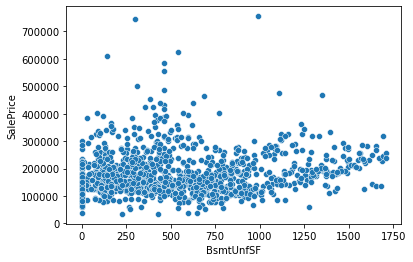

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


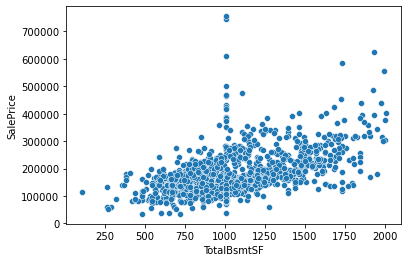

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


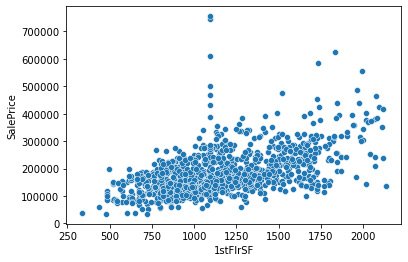

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


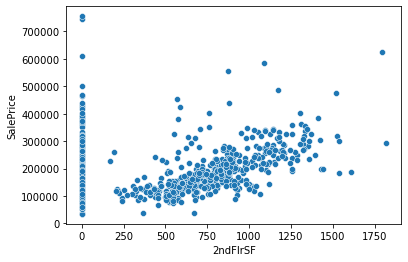

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


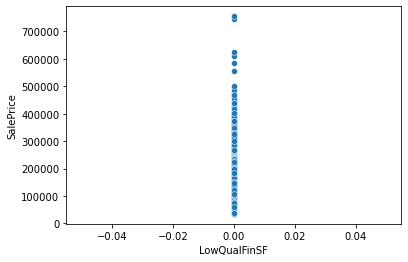

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


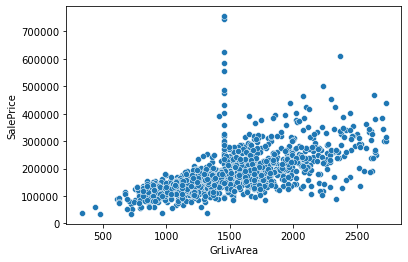

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


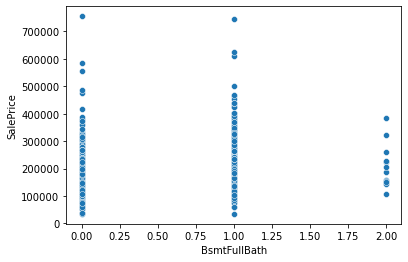

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


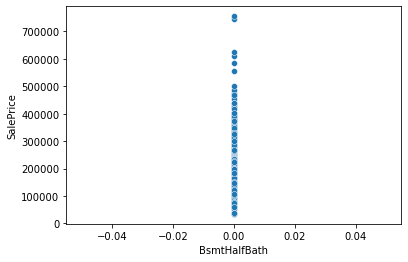

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


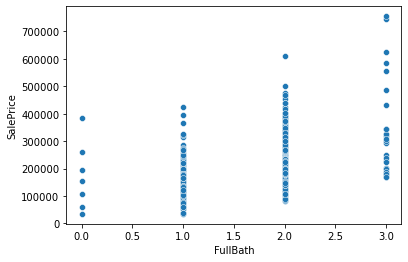

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


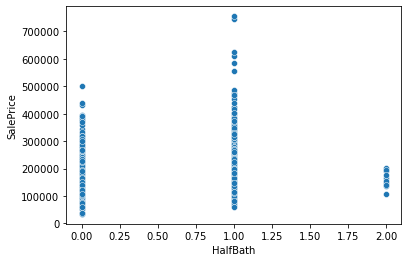

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


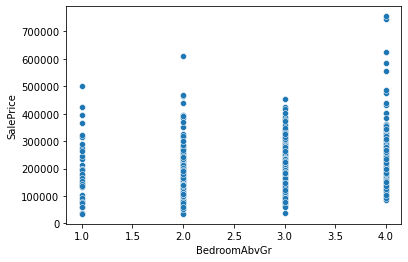

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


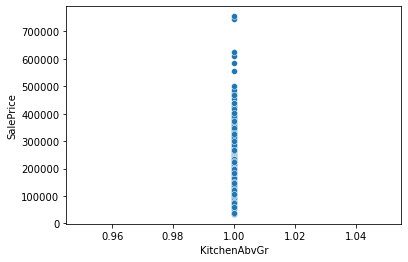

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


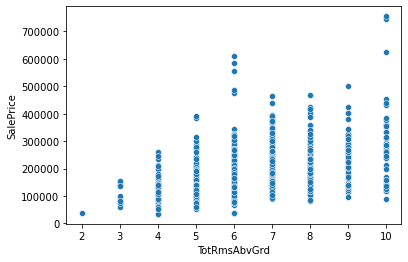

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


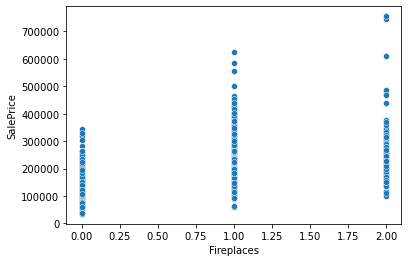

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


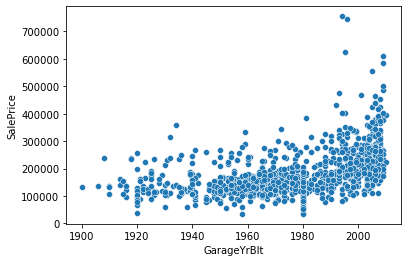

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


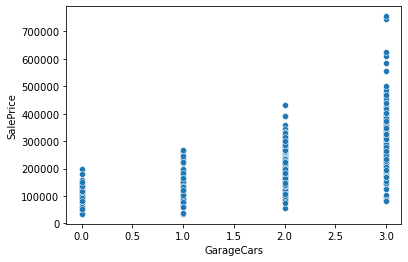

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


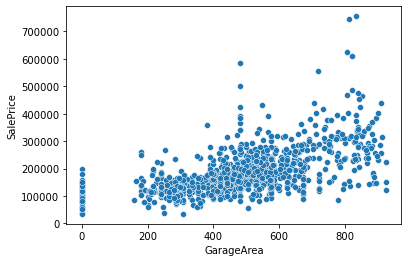

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


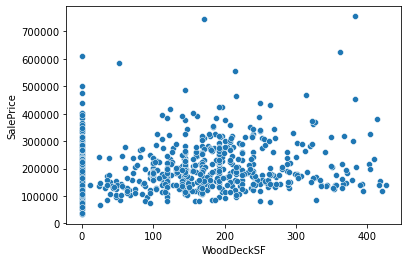

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


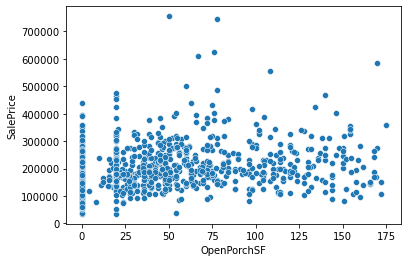

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


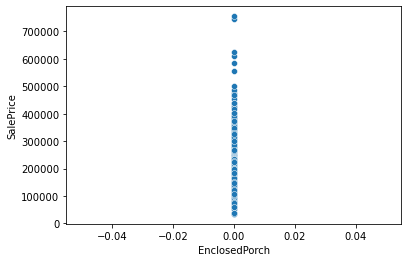

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


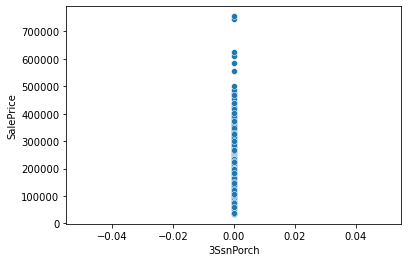

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


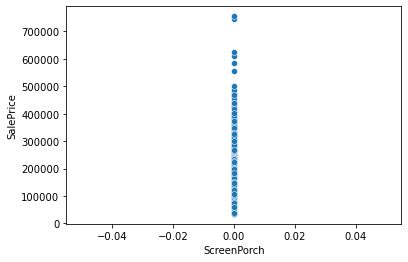

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


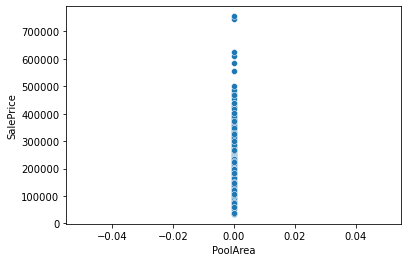

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


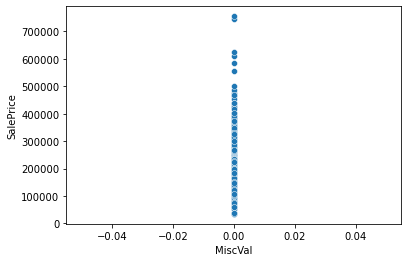

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


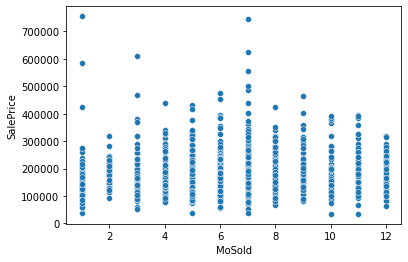

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


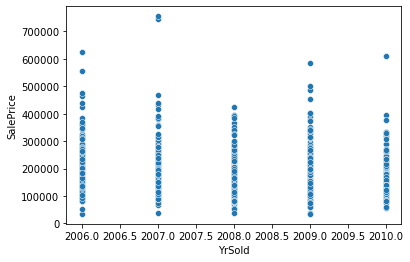

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


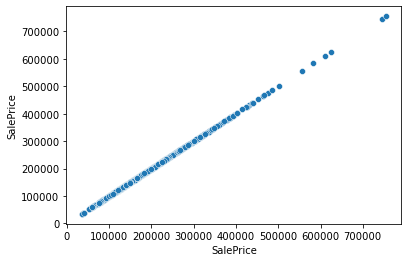

In [19]:
#scatter plot every numeric column with price
for i,column in enumerate(train.columns):
    if train[column].dtype != "object":
        sns.scatterplot(train[column], train.SalePrice)
        plt.savefig("housing/scatt"+str(i)+".png")
        plt.show()

In [20]:
#droping single value columns
train.drop(["BsmtFinSF2", "LowQualFinSF", "BsmtHalfBath", "KitchenAbvGr", "EnclosedPorch"
           , "3SsnPorch", "ScreenPorch", "PoolArea", "MiscVal"]\
           , axis=1, inplace=True)

In [21]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 66 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1168 non-null   float64
 1   MSZoning       1168 non-null   object 
 2   LotFrontage    1168 non-null   float64
 3   LotArea        1168 non-null   float64
 4   Street         1168 non-null   object 
 5   LotShape       1168 non-null   object 
 6   LandContour    1168 non-null   object 
 7   LotConfig      1168 non-null   object 
 8   LandSlope      1168 non-null   object 
 9   Neighborhood   1168 non-null   object 
 10  Condition1     1168 non-null   object 
 11  Condition2     1168 non-null   object 
 12  BldgType       1168 non-null   object 
 13  HouseStyle     1168 non-null   object 
 14  OverallQual    1168 non-null   float64
 15  OverallCond    1168 non-null   float64
 16  YearBuilt      1168 non-null   float64
 17  YearRemodAdd   1168 non-null   float64
 18  RoofStyl

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


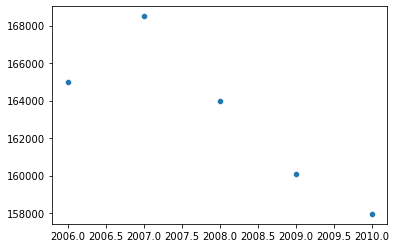

In [22]:
years = [int(i) for i in list(train["YrSold"].unique())]
avg_pl = []
for year in years:
    avg_pl.append(train[train["YrSold"] == year]["SalePrice"].median())
sns.scatterplot(years, avg_pl)

In [23]:
train.skew()

MSSubClass      0.815833
LotFrontage     0.023473
LotArea        -0.074638
OverallQual     0.250638
OverallCond     0.899758
YearBuilt      -0.516820
YearRemodAdd   -0.495864
MasVnrArea      1.562870
BsmtFinSF1      0.676109
BsmtUnfSF       0.738744
TotalBsmtSF     0.540765
1stFlrSF        0.563538
2ndFlrSF        0.784540
GrLivArea       0.466975
BsmtFullBath    0.554763
FullBath        0.057809
HalfBath        0.656492
BedroomAbvGr   -0.329251
TotRmsAbvGrd    0.337007
Fireplaces      0.544548
GarageYrBlt    -0.674913
GarageCars     -0.442705
GarageArea     -0.199532
WoodDeckSF      1.003334
OpenPorchSF     1.240135
MoSold          0.220979
YrSold          0.115765
SalePrice       1.953878
dtype: float64

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


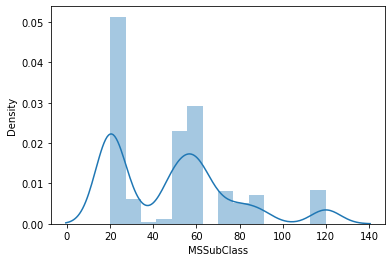

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


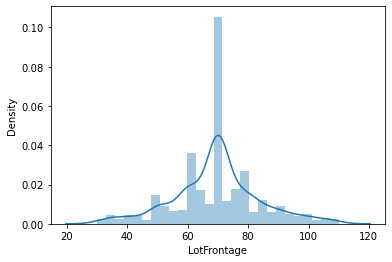

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


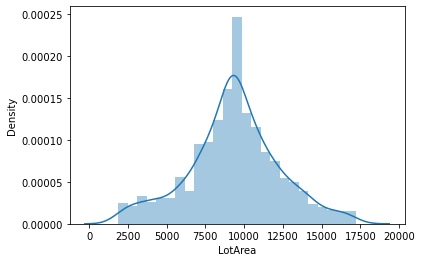

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


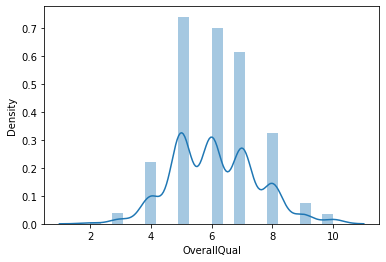

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


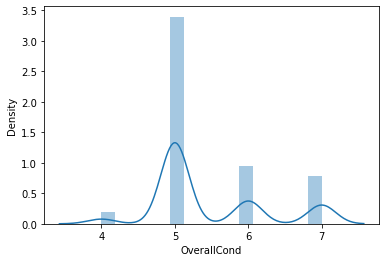

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


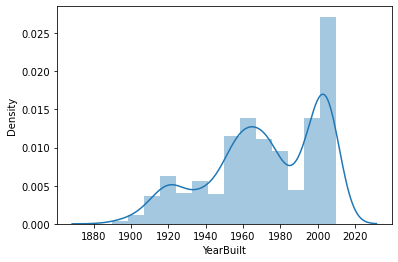

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


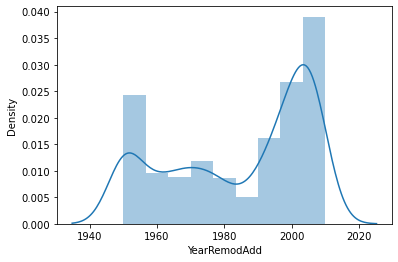

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


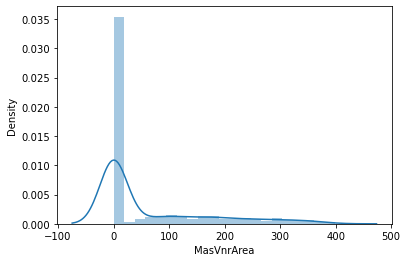

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


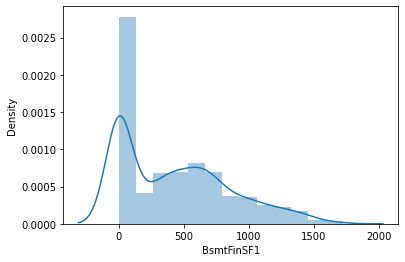

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


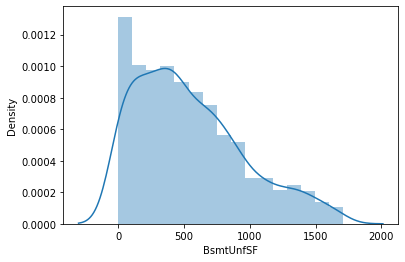

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


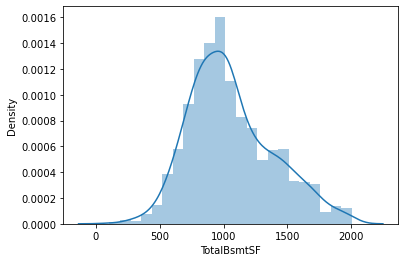

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


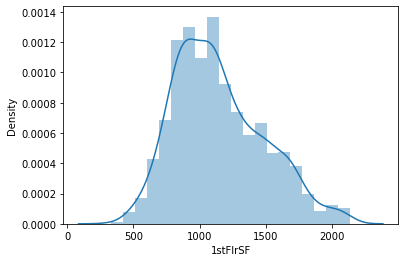

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


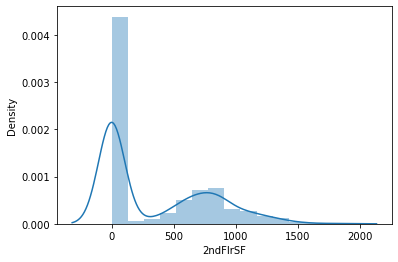

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


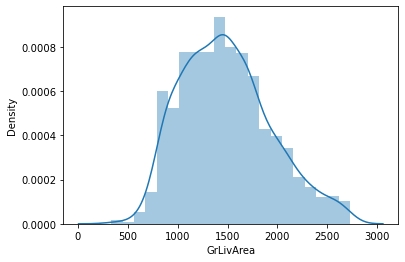

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


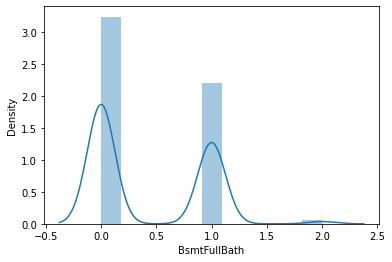

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


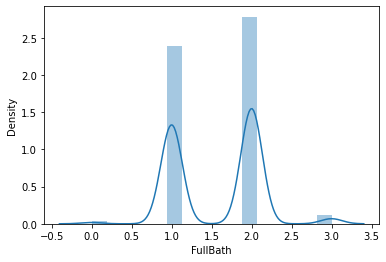

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


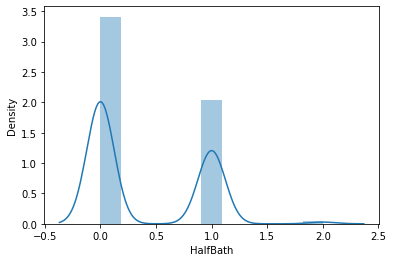

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


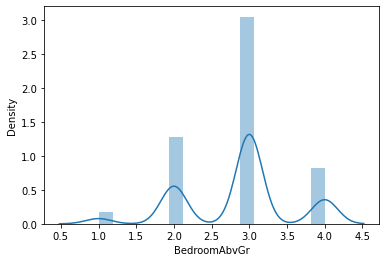

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


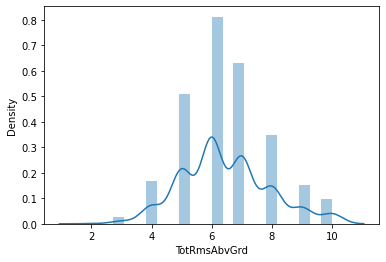

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


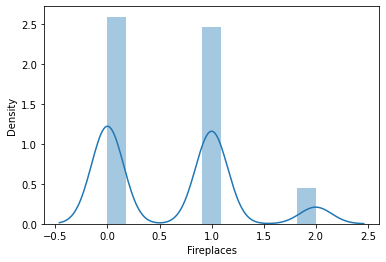

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


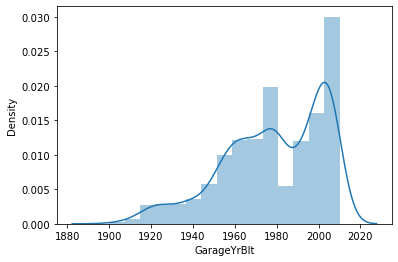

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


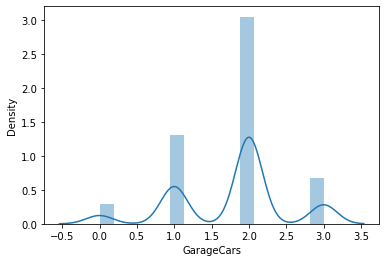

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


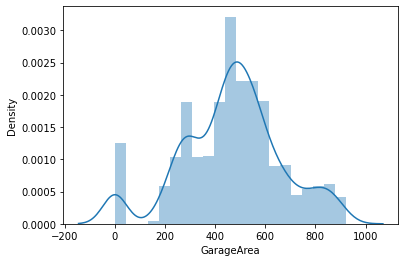

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


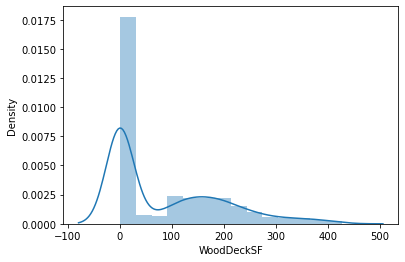

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


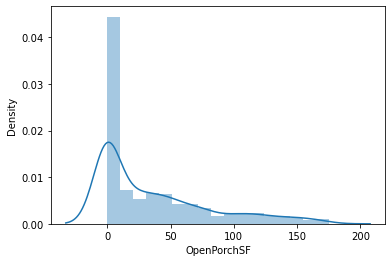

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


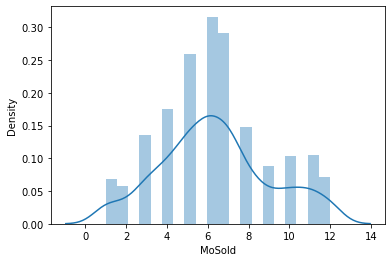

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


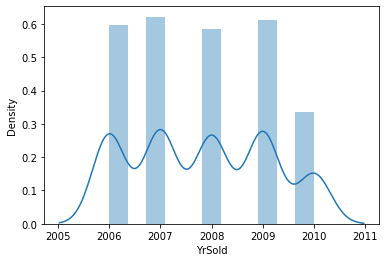

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


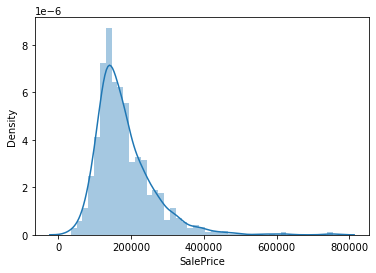

In [24]:
for i,column in enumerate( train.columns):
    if train[column].dtype != "object":
        sns.distplot(train[column])
        plt.savefig("housing/box"+str(i)+".png")
        plt.show()

In [25]:
corr = train.corr()

In [26]:
corr

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SalePrice
MSSubClass,1.000000,-0.237090,-0.248920,0.190384,-0.123287,0.101588,0.112049,0.024768,-0.028776,-0.054899,-0.090273,-0.076524,0.326348,0.200744,0.003696,0.204030,0.193581,-0.026272,0.143095,0.084587,0.112423,0.087385,0.009272,0.036515,0.049256,0.055712,-0.035355,0.084556
LotFrontage,-0.237090,1.000000,0.473858,0.213298,-0.056428,0.163479,0.074926,0.221779,0.114471,0.059066,0.237440,0.293346,0.092049,0.296777,0.037093,0.177003,0.111597,0.282082,0.290697,0.165473,0.076064,0.279980,0.286947,0.128486,0.114944,0.045224,0.003867,0.330722
LotArea,-0.248920,0.473858,1.000000,0.209671,0.000103,0.108074,0.057736,0.117702,0.154788,0.040676,0.282090,0.349737,0.104083,0.344283,0.072399,0.185454,0.121747,0.309966,0.343213,0.271694,0.037484,0.248369,0.273554,0.146891,0.122289,0.008665,-0.043629,0.366987
OverallQual,0.190384,0.213298,0.209671,1.000000,-0.207332,0.591500,0.552060,0.251887,0.166704,0.240097,0.427149,0.403959,0.297031,0.551330,0.108925,0.543278,0.300995,0.130940,0.392625,0.383494,0.513275,0.601758,0.553054,0.230965,0.383828,0.081620,-0.048417,0.788122
OverallCond,-0.123287,-0.056428,0.000103,-0.207332,1.000000,-0.348812,-0.105793,-0.121933,-0.011759,-0.139510,-0.191115,-0.124569,-0.062392,-0.146671,-0.016305,-0.245329,-0.080602,-0.028972,-0.120767,-0.040558,-0.305706,-0.219646,-0.161442,-0.031298,-0.169415,-0.031544,0.053061,-0.140001
YearBuilt,0.101588,0.163479,0.108074,0.591500,-0.348812,1.000000,0.610035,0.275821,0.210093,0.129634,0.407210,0.290312,0.029373,0.252397,0.154835,0.480978,0.247281,-0.013948,0.115907,0.134263,0.783207,0.546293,0.484648,0.250336,0.326126,0.031301,-0.009758,0.526119
YearRemodAdd,0.112049,0.074926,0.057736,0.552060,-0.105793,0.610035,1.000000,0.120934,0.100804,0.143013,0.259421,0.240932,0.152843,0.300981,0.104947,0.444446,0.194943,-0.020545,0.190354,0.113212,0.612726,0.434062,0.390332,0.231400,0.317024,0.024663,0.033265,0.507831
MasVnrArea,0.024768,0.221779,0.117702,0.251887,-0.121933,0.275821,0.120934,1.000000,0.162078,0.026753,0.220436,0.215253,0.080091,0.233786,0.058311,0.168415,0.135783,0.129571,0.186069,0.154369,0.186044,0.266851,0.277718,0.129940,0.114098,0.076185,0.006547,0.224282
BsmtFinSF1,-0.028776,0.114471,0.154788,0.166704,-0.011759,0.210093,0.100804,0.162078,1.000000,-0.533923,0.373118,0.340354,-0.178910,0.085170,0.645621,0.032774,-0.007707,-0.086853,-0.010126,0.211071,0.115434,0.183558,0.238049,0.195295,0.047453,0.027143,0.005949,0.333777
BsmtUnfSF,-0.054899,0.059066,0.040676,0.240097,-0.139510,0.129634,0.143013,0.026753,-0.533923,1.000000,0.285967,0.207443,0.024900,0.186431,-0.424967,0.222499,-0.044958,0.126107,0.191311,0.024030,0.143474,0.182170,0.148750,-0.054622,0.140896,0.042862,-0.055294,0.122239


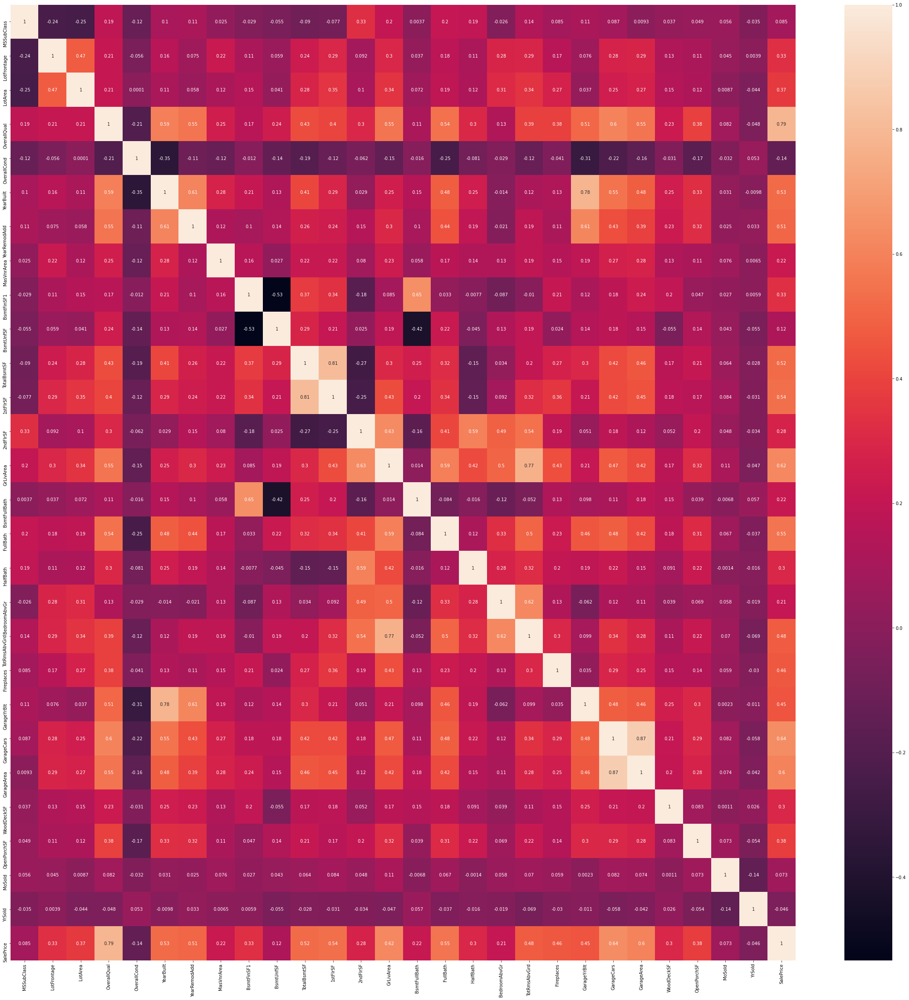

In [27]:
plt.figure(figsize=(40,40))
sns.heatmap(corr, annot=True)
plt.savefig("housing/box"+".png")

In [28]:
sk_col = [colum for colum in train.columns if train[colum].dtype != 'object' and train[colum].skew() > 0.57]

In [29]:
#removing skewness from columns except for overall cond and years
for col in sk_col[:-1]:
    if col != "OverallCond":
        if 'yr' or "year" not in col.lower():
            train[col] = np.sqrt(train[col])

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


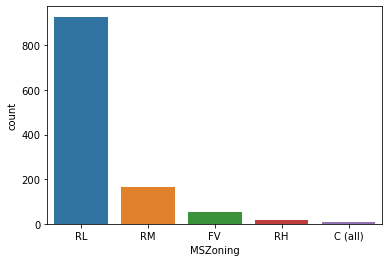

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


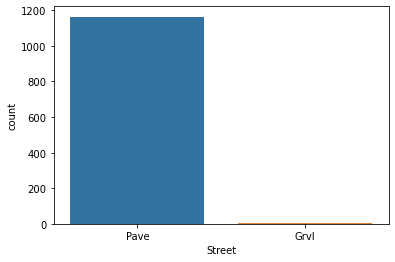

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


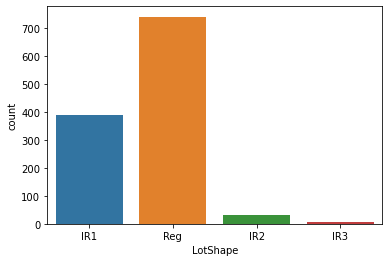

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


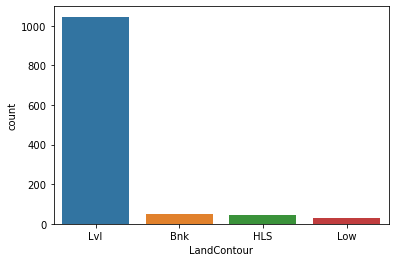

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


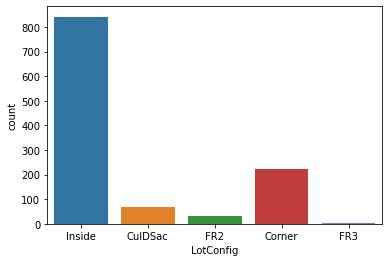

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


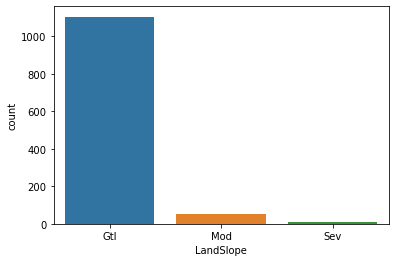

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


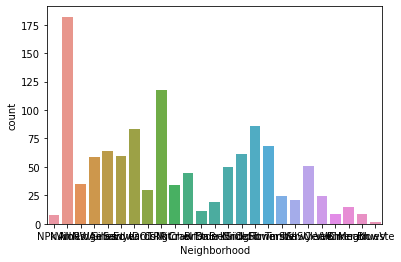

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


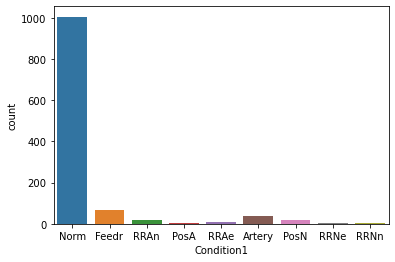

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


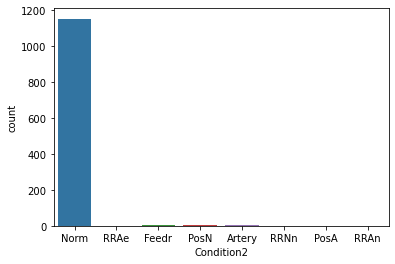

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


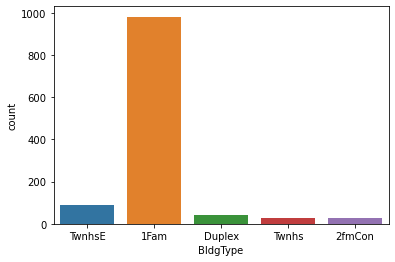

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


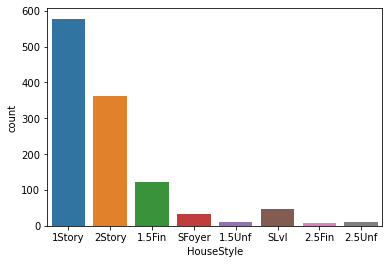

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


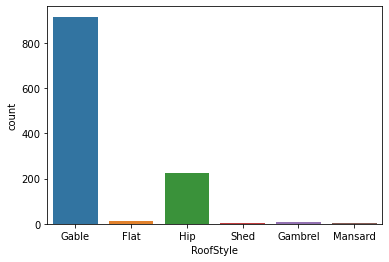

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


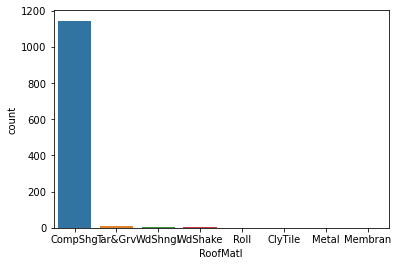

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


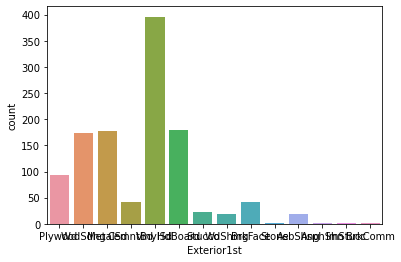

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


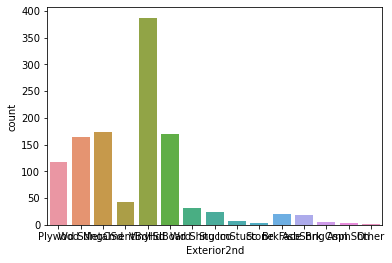

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


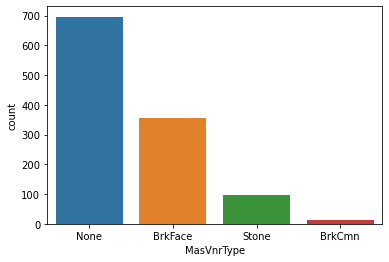

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


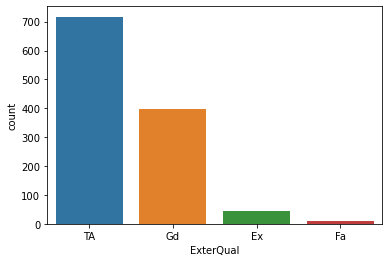

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


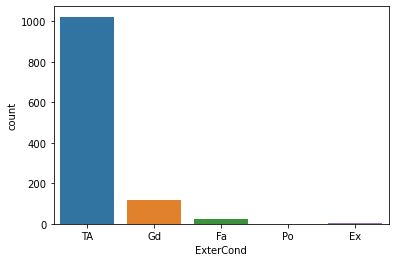

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


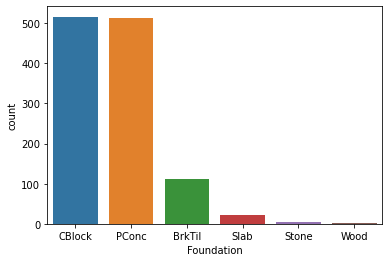

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


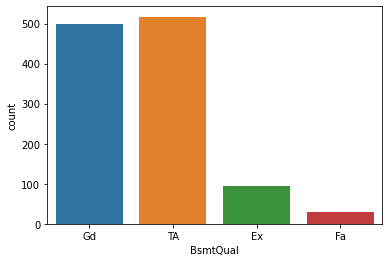

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


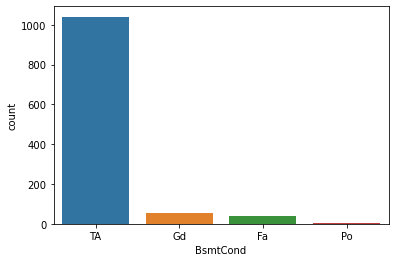

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


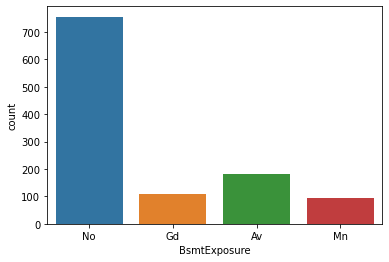

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


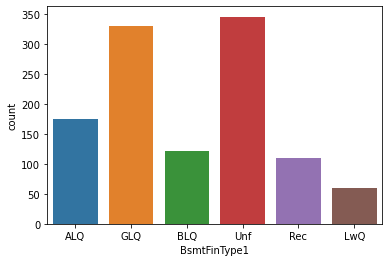

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


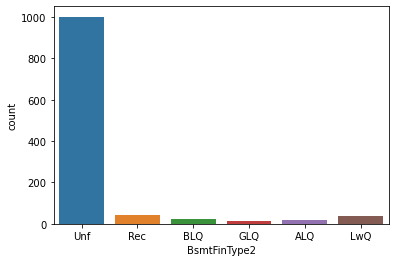

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


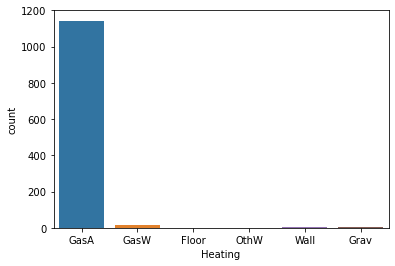

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


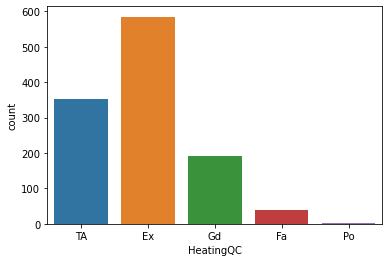

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


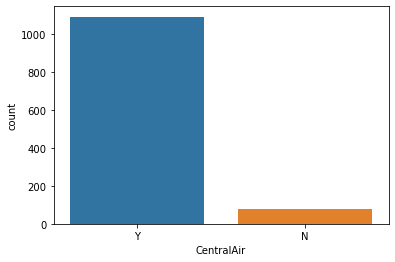

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


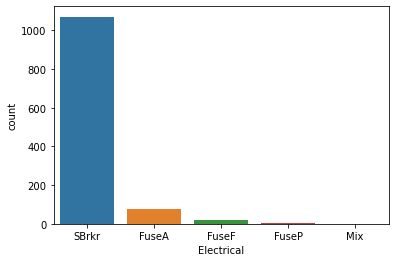

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


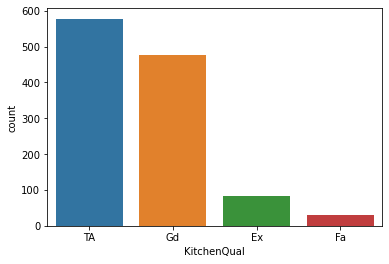

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


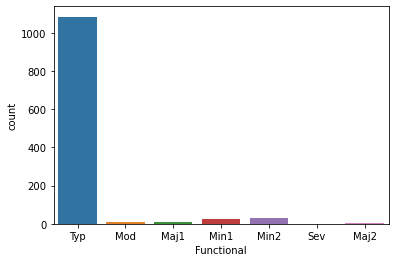

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


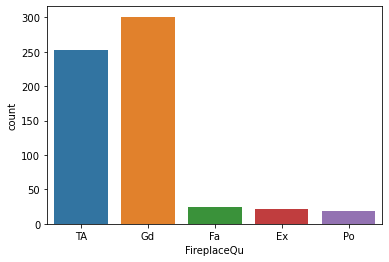

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


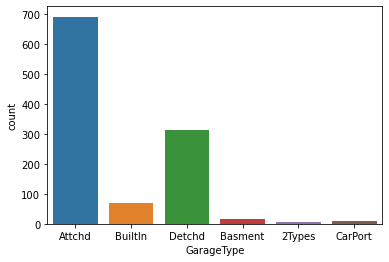

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


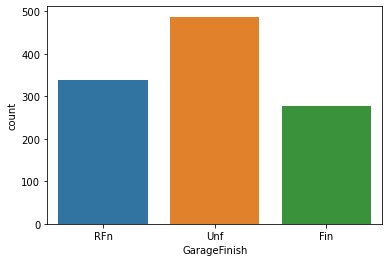

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


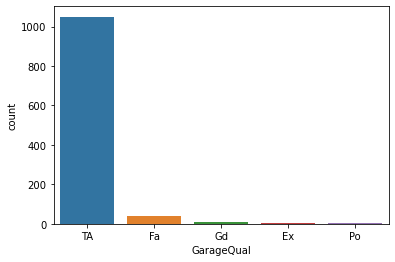

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


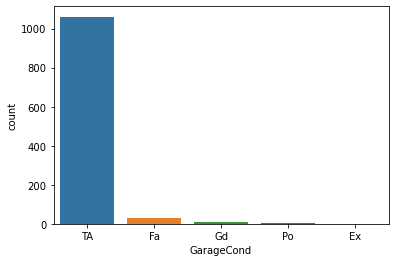

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


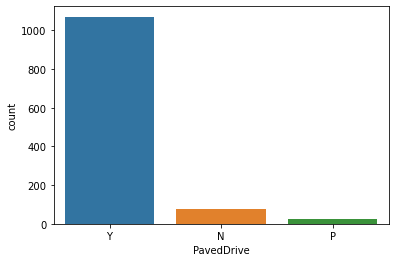

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


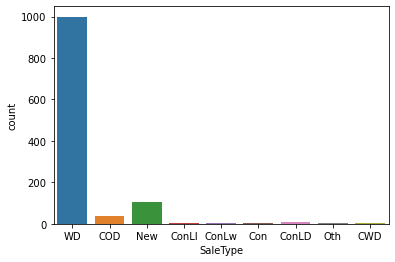

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


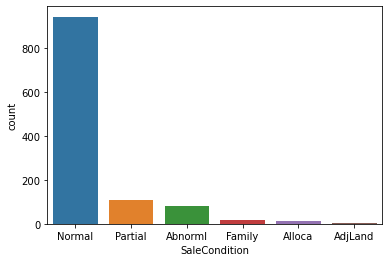

In [30]:
for i,column in enumerate(train.columns):
    if train[column].dtype == "object":
        sns.countplot(train[column])
        plt.savefig("housing/box"+str(i)+".png")
        plt.show()

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


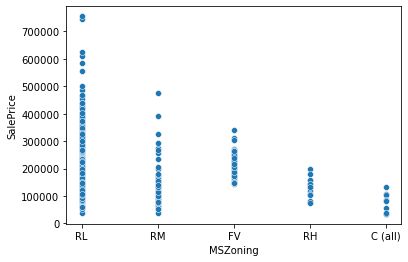

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


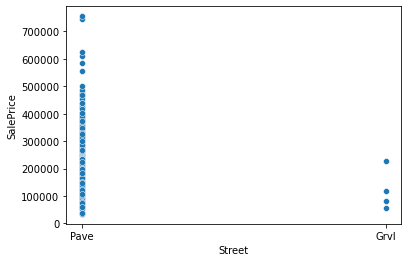

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


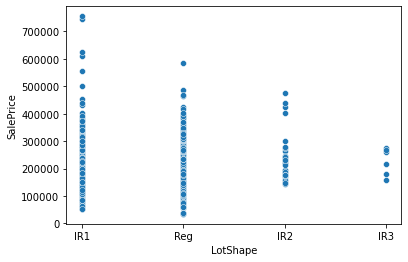

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


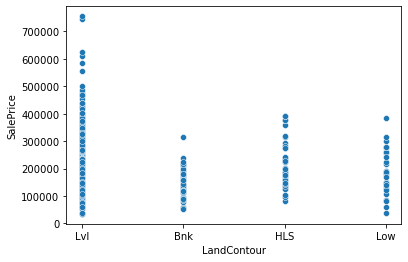

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


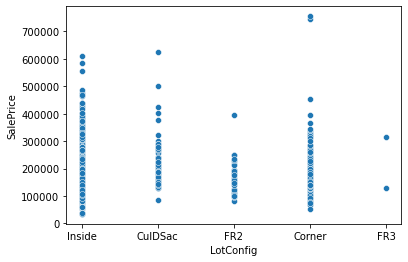

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


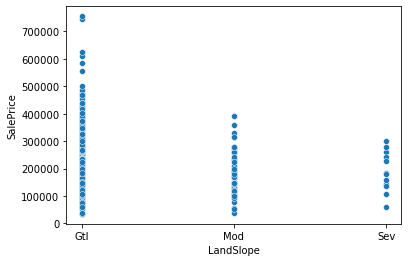

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


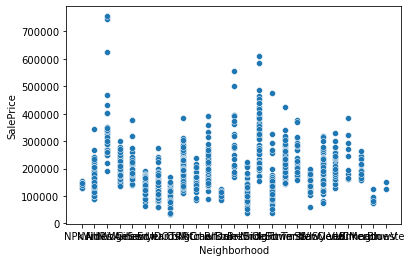

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


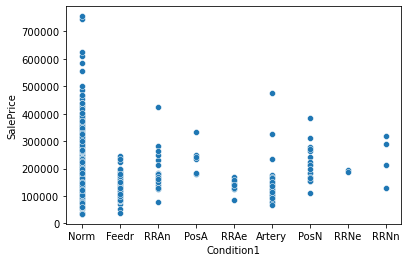

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


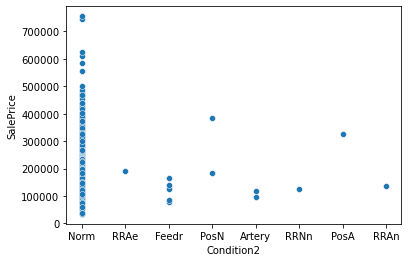

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


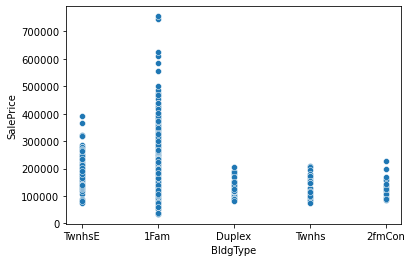

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


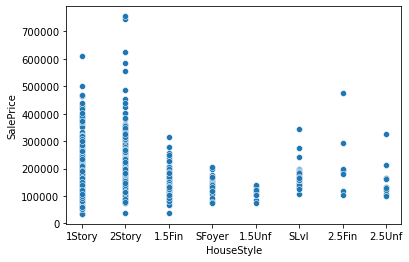

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


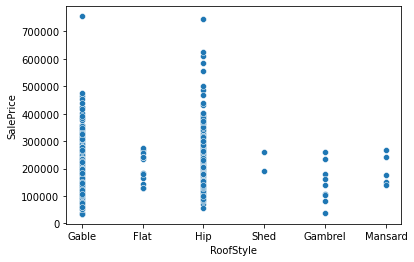

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


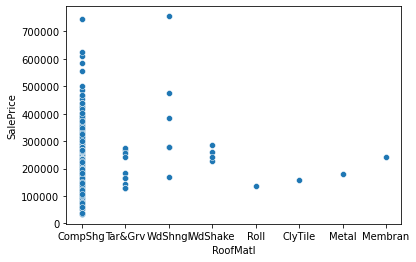

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


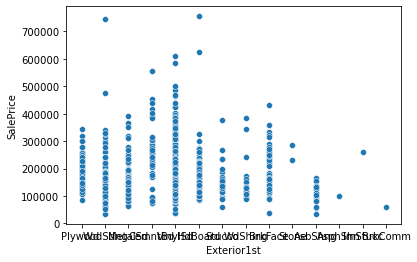

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


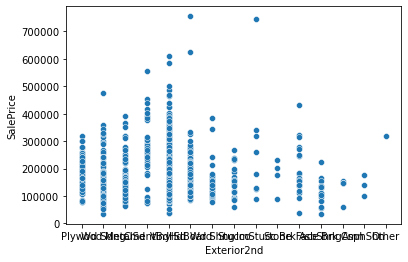

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


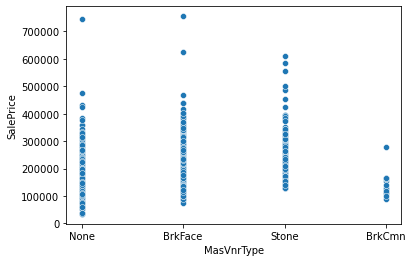

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


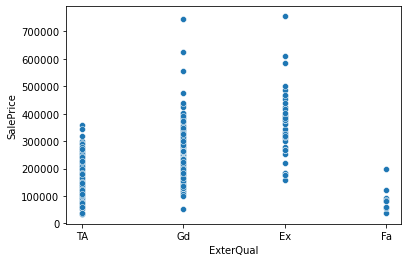

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


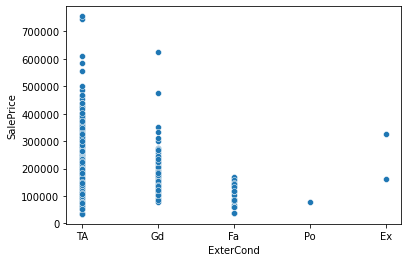

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


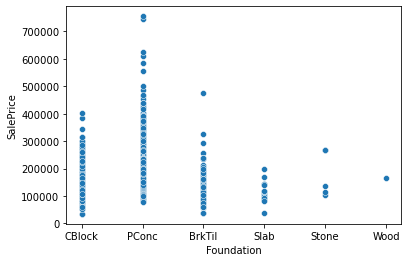

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


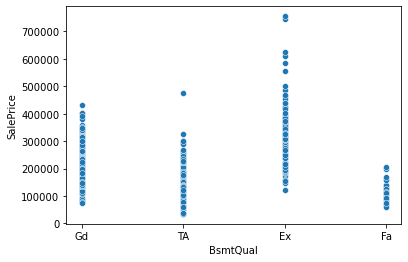

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


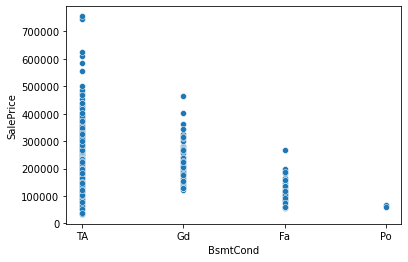

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


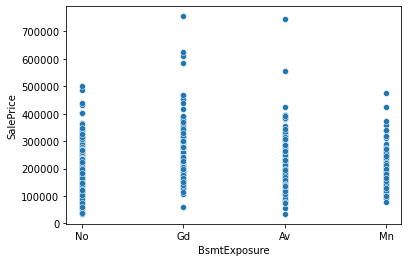

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


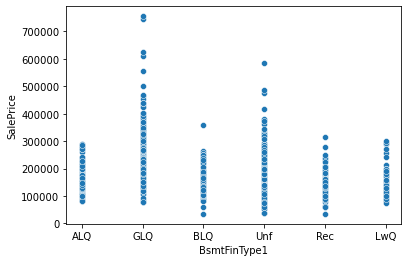

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


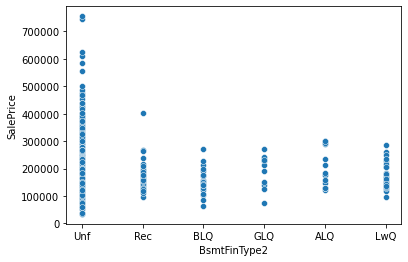

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


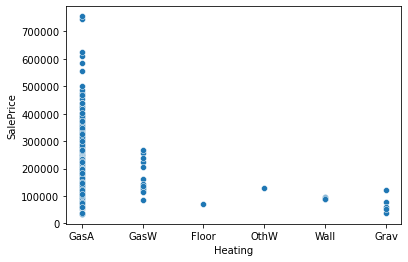

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


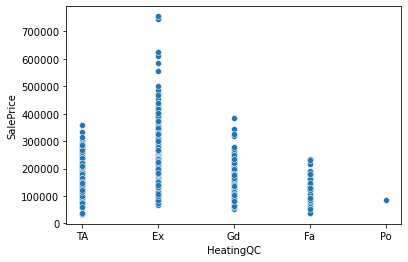

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


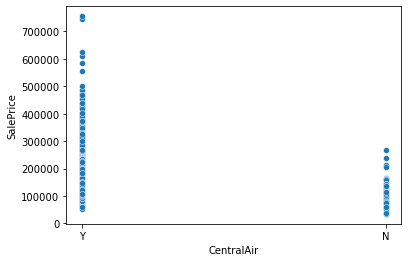

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


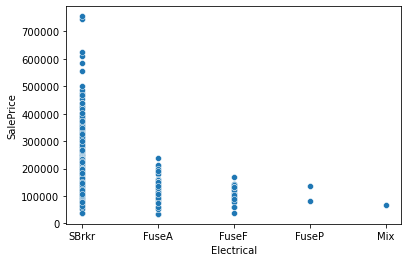

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


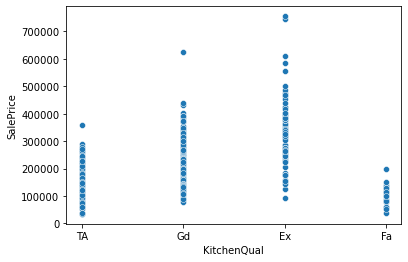

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


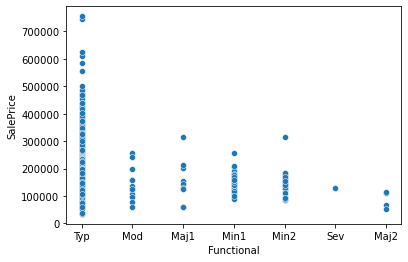

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


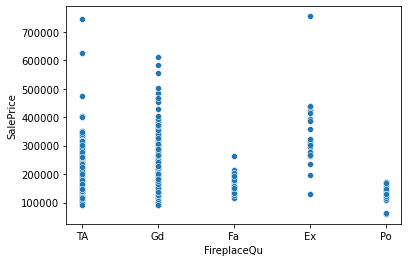

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


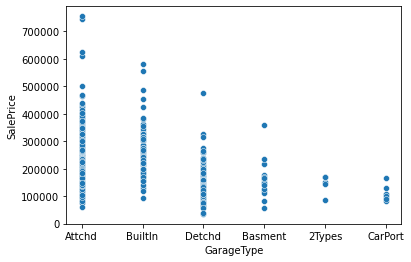

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


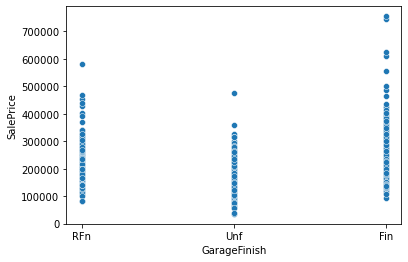

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


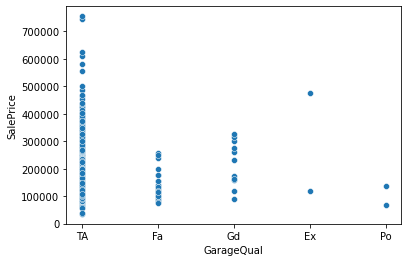

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


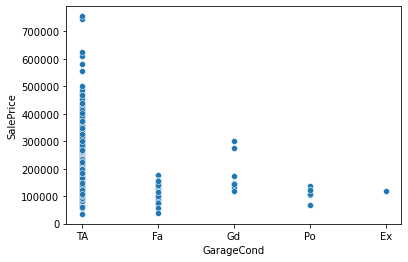

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


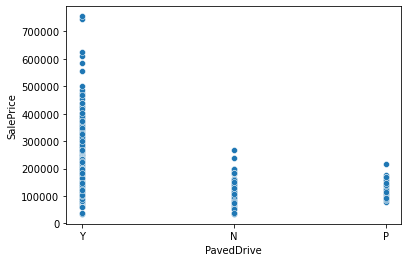

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


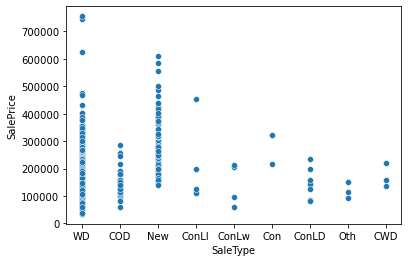

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


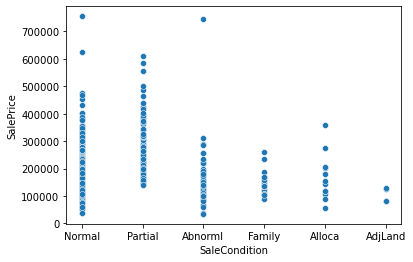

In [31]:
for column in train.columns:
    if train[column].dtype == "object":
        sns.scatterplot(train[column], train.SalePrice)
        plt.show()

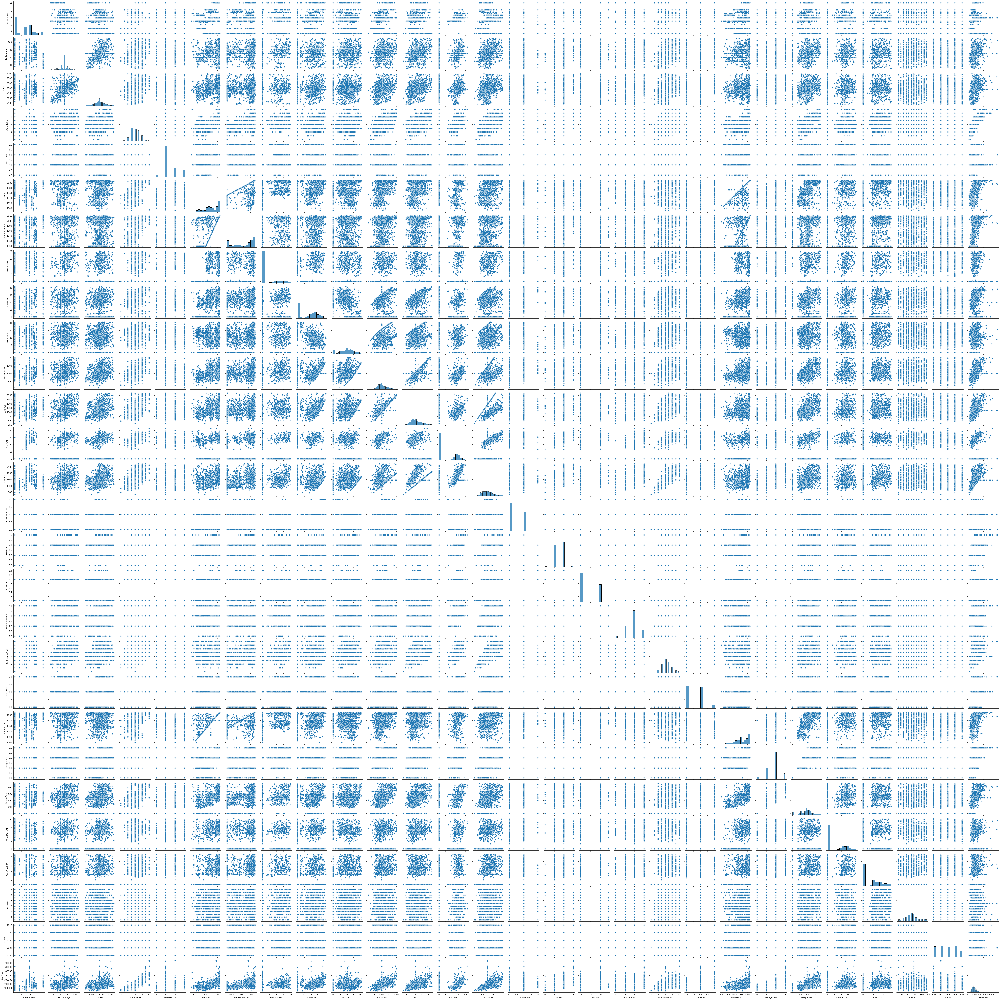

In [32]:
sns.pairplot(train)

In [33]:
train.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,10.954451,RL,70.0,4928.0,Pave,IR1,Lvl,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6.0,5.0,1976.0,1976.0,Gable,CompShg,Plywood,Plywood,None,0.000000,TA,TA,CBlock,Gd,TA,No,ALQ,10.954451,Unf,30.951575,1078.0,GasA,TA,Y,SBrkr,958.0,0.000000,958.0,0.0,2.0,0.0,2.0,TA,5.0,Typ,1.0,TA,Attchd,1977.0,RFn,2.0,440.0,TA,TA,Y,0.000000,4.472136,2.0,2007.0,WD,Normal,128000
1,4.472136,RL,95.0,15865.0,Pave,IR1,Lvl,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8.0,6.0,1970.0,1970.0,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.000000,Gd,Gd,PConc,TA,Gd,Gd,ALQ,18.734994,Rec,32.295511,1008.0,GasA,Ex,Y,SBrkr,1092.0,0.000000,2217.0,1.0,2.0,0.0,4.0,Gd,8.0,Typ,1.0,TA,Attchd,1970.0,Unf,2.0,621.0,TA,TA,Y,9.000000,4.472136,10.0,2007.0,WD,Normal,268000
2,7.745967,RL,92.0,9920.0,Pave,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7.0,5.0,1996.0,1997.0,Gable,CompShg,MetalSd,MetalSd,None,0.000000,Gd,TA,PConc,Gd,TA,Av,GLQ,29.359837,Unf,15.968719,1117.0,GasA,Ex,Y,SBrkr,1127.0,29.765752,2013.0,1.0,2.0,1.0,3.0,TA,8.0,Typ,1.0,TA,Attchd,1997.0,Unf,2.0,455.0,TA,TA,Y,13.416408,11.401754,6.0,2007.0,WD,Normal,269790
3,4.472136,RL,105.0,11751.0,Pave,IR1,Lvl,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6.0,6.0,1977.0,1977.0,Hip,CompShg,Plywood,Plywood,BrkFace,0.000000,TA,TA,CBlock,Gd,TA,No,BLQ,26.551836,Unf,33.749074,1844.0,GasA,Ex,Y,SBrkr,1844.0,0.000000,1844.0,0.0,2.0,0.0,3.0,TA,7.0,Typ,1.0,TA,Attchd,1977.0,RFn,2.0,546.0,TA,TA,Y,0.000000,11.045361,1.0,2010.0,COD,Normal,190000
4,4.472136,RL,70.0,16635.0,Pave,IR1,Lvl,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6.0,7.0,1977.0,2000.0,Gable,CompShg,CemntBd,CmentBd,Stone,11.224972,Gd,TA,CBlock,Gd,TA,No,ALQ,35.298725,Unf,18.867962,1602.0,GasA,Gd,Y,SBrkr,1602.0,0.000000,1602.0,0.0,2.0,0.0,3.0,Gd,8.0,Typ,1.0,TA,Attchd,1977.0,Fin,2.0,529.0,TA,TA,Y,15.491933,0.000000,6.0,2009.0,WD,Normal,215000


In [34]:
for col in train.columns:
    if "yr" in col.lower() or "year" in col.lower():
        print(col)

YearBuilt
YearRemodAdd
GarageYrBlt
YrSold


In [35]:
#create a new column of difference between built year and sold year
train["builtTosale"] = train["YrSold"] - train["YearBuilt"]

In [36]:
#create a new column with difference between modification year and sold year
train["modiTosale"] = train["YrSold"] - train["YearRemodAdd"]

In [37]:
#create a new column with difference between garage made year and sold year
train["garageTosale"] = train["YrSold"] - train["GarageYrBlt"]

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


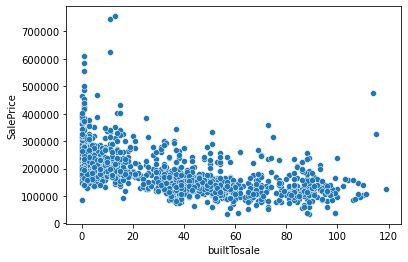

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


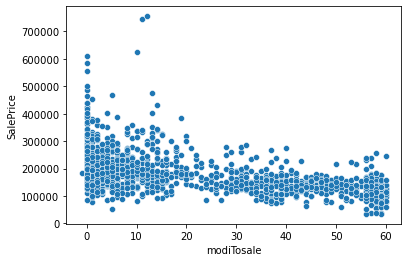

D:\PROGRAM_FILES\Anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


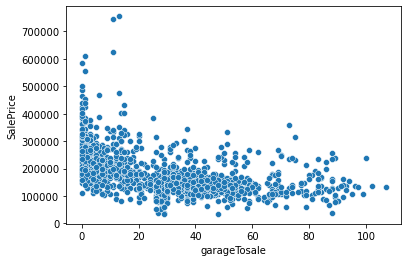

In [40]:
sns.scatterplot(train["builtTosale"], train.SalePrice)
plt.show()
sns.scatterplot(train["modiTosale"], train.SalePrice)
plt.show()
sns.scatterplot(train["garageTosale"], train.SalePrice)
plt.show()

In [41]:
train

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice,builtTosale,modiTosale,garageTosale
0,10.954451,RL,70.0,4928.0,Pave,IR1,Lvl,Inside,Gtl,NPkVill,Norm,Norm,TwnhsE,1Story,6.0,5.0,1976.0,1976.0,Gable,CompShg,Plywood,Plywood,None,0.000000,TA,TA,CBlock,Gd,TA,No,ALQ,10.954451,Unf,30.951575,1078.0,GasA,TA,Y,SBrkr,958.0,0.000000,958.0,0.0,2.0,0.0,2.0,TA,5.0,Typ,1.0,TA,Attchd,1977.0,RFn,2.0,440.0,TA,TA,Y,0.000000,4.472136,2.0,2007.0,WD,Normal,128000,31.0,31.0,30.0
1,4.472136,RL,95.0,15865.0,Pave,IR1,Lvl,Inside,Mod,NAmes,Norm,Norm,1Fam,1Story,8.0,6.0,1970.0,1970.0,Flat,Tar&Grv,Wd Sdng,Wd Sdng,None,0.000000,Gd,Gd,PConc,TA,Gd,Gd,ALQ,18.734994,Rec,32.295511,1008.0,GasA,Ex,Y,SBrkr,1092.0,0.000000,2217.0,1.0,2.0,0.0,4.0,Gd,8.0,Typ,1.0,TA,Attchd,1970.0,Unf,2.0,621.0,TA,TA,Y,9.000000,4.472136,10.0,2007.0,WD,Normal,268000,37.0,37.0,37.0
2,7.745967,RL,92.0,9920.0,Pave,IR1,Lvl,CulDSac,Gtl,NoRidge,Norm,Norm,1Fam,2Story,7.0,5.0,1996.0,1997.0,Gable,CompShg,MetalSd,MetalSd,None,0.000000,Gd,TA,PConc,Gd,TA,Av,GLQ,29.359837,Unf,15.968719,1117.0,GasA,Ex,Y,SBrkr,1127.0,29.765752,2013.0,1.0,2.0,1.0,3.0,TA,8.0,Typ,1.0,TA,Attchd,1997.0,Unf,2.0,455.0,TA,TA,Y,13.416408,11.401754,6.0,2007.0,WD,Normal,269790,11.0,10.0,10.0
3,4.472136,RL,105.0,11751.0,Pave,IR1,Lvl,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6.0,6.0,1977.0,1977.0,Hip,CompShg,Plywood,Plywood,BrkFace,0.000000,TA,TA,CBlock,Gd,TA,No,BLQ,26.551836,Unf,33.749074,1844.0,GasA,Ex,Y,SBrkr,1844.0,0.000000,1844.0,0.0,2.0,0.0,3.0,TA,7.0,Typ,1.0,TA,Attchd,1977.0,RFn,2.0,546.0,TA,TA,Y,0.000000,11.045361,1.0,2010.0,COD,Normal,190000,33.0,33.0,33.0
4,4.472136,RL,70.0,16635.0,Pave,IR1,Lvl,FR2,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6.0,7.0,1977.0,2000.0,Gable,CompShg,CemntBd,CmentBd,Stone,11.224972,Gd,TA,CBlock,Gd,TA,No,ALQ,35.298725,Unf,18.867962,1602.0,GasA,Gd,Y,SBrkr,1602.0,0.000000,1602.0,0.0,2.0,0.0,3.0,Gd,8.0,Typ,1.0,TA,Attchd,1977.0,Fin,2.0,529.0,TA,TA,Y,15.491933,0.000000,6.0,2009.0,WD,Normal,215000,32.0,9.0,32.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,4.472136,RL,70.0,9819.0,Pave,IR1,Lvl,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5.0,5.0,1967.0,1967.0,Gable,CompShg,MetalSd,MetalSd,BrkFace,5.567764,TA,Gd,CBlock,TA,TA,No,BLQ,21.213203,Unf,20.784610,882.0,GasA,TA,Y,SBrkr,900.0,0.000000,900.0,0.0,1.0,0.0,3.0,TA,5.0,Typ,0.0,NaN,Detchd,1970.0,Unf,1.0,280.0,TA,TA,Y,0.000000,0.000000,2.0,2010.0,WD,Normal,122000,43.0,43.0,40.0
1164,4.472136,RL,67.0,8777.0,Pave,Reg,Lvl,Inside,Gtl,Edwards,Feedr,Norm,1Fam,1Story,4.0,5.0,1949.0,2003.0,Gable,CompShg,VinylSd,VinylSd,None,0.000000,TA,TA,CBlock,NaN,NaN,NaN,NaN,0.000000,NaN,0.000000,1008.0,GasA,Ex,Y,SBrkr,1126.0,0.000000,1126.0,0.0,2.0,0.0,2.0,Gd,5.0,Typ,0.0,NaN,Detchd,2002.0,Fin,2.0,520.0,TA,TA,N,0.000000,9.797959,5.0,2009.0,WD,Normal,108000,60.0,6.0,7.0
1165,7.071068,RL,70.0,2280.0,Pave,Reg,Lvl,FR2,Gtl,NPkVill,Norm,Norm,Twnhs,2Story,6.0,6.0,1976.0,1976.0,Gable,CompShg,Plywood,Brk Cmn,None,0.000000,TA,TA,CBlock,Gd,TA,No,ALQ,23.790755,Unf,17.000000,855.0,GasA,TA,Y,SBrkr,855.0,24.515301,1456.0,0.0,2.0,1.0,3.0,TA,7.0,Typ,1.0,TA,Attchd,1976.0,Unf,2.0,440.0,TA,TA,Y,9.327379,0.000000,7.0,2009.0,WD,Normal,1

In [42]:
#ENCODING

In [43]:
from sklearn.preprocessing import LabelEncoder

In [44]:
for column in train.columns:
    if train[column].dtype == "object":
        train[column] = train[column].astype(str)
        le = LabelEncoder()
        train[column] = le.fit_transform(train[column])

In [45]:
train

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,BedroomAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,MoSold,YrSold,SaleType,SaleCondition,SalePrice,builtTosale,modiTosale,garageTosale
0,10.954451,3,70.0,4928.0,1,0,3,4,0,13,2,2,4,2,6.0,5.0,1976.0,1976.0,1,1,8,9,2,0.000000,3,4,1,2,3,3,0,10.954451,5,30.951575,1078.0,1,4,1,4,958.0,0.000000,958.0,0.0,2.0,0.0,2.0,3,5.0,6,1.0,4,1,1977.0,1,2.0,440.0,4,4,2,0.000000,4.472136,2.0,2007.0,8,4,128000,31.0,31.0,30.0
1,4.472136,3,95.0,15865.0,1,0,3,4,1,12,2,2,0,2,8.0,6.0,1970.0,1970.0,0,5,12,13,2,0.000000,2,2,2,3,1,1,0,18.734994,4,32.295511,1008.0,1,0,1,4,1092.0,0.000000,2217.0,1.0,2.0,0.0,4.0,2,8.0,6,1.0,4,1,1970.0,2,2.0,621.0,4,4,2,9.000000,4.472136,10.0,2007.0,8,4,268000,37.0,37.0,37.0
2,7.745967,3,92.0,9920.0,1,0,3,1,0,15,2,2,0,5,7.0,5.0,1996.0,1997.0,1,1,7,7,2,0.000000,2,4,2,2,3,0,2,29.359837,5,15.968719,1117.0,1,0,1,4,1127.0,29.765752,2013.0,1.0,2.0,1.0,3.0,3,8.0,6,1.0,4,1,1997.0,2,2.0,455.0,4,4,2,13.416408,11.401754,6.0,2007.0,8,4,269790,11.0,10.0,10.0
3,4.472136,3,105.0,11751.0,1,0,3,4,0,14,2,2,0,2,6.0,6.0,1977.0,1977.0,3,1,8,9,1,0.000000,3,4,1,2,3,3,1,26.551836,5,33.749074,1844.0,1,0,1,4,1844.0,0.000000,1844.0,0.0,2.0,0.0,3.0,3,7.0,6,1.0,4,1,1977.0,1,2.0,546.0,4,4,2,0.000000,11.045361,1.0,2010.0,0,4,190000,33.0,33.0,33.0
4,4.472136,3,70.0,16635.0,1,0,3,2,0,14,2,2,0,2,6.0,7.0,1977.0,2000.0,1,1,4,4,3,11.224972,2,4,1,2,3,3,0,35.298725,5,18.867962,1602.0,1,2,1,4,1602.0,0.000000,1602.0,0.0,2.0,0.0,3.0,2,8.0,6,1.0,4,1,1977.0,0,2.0,529.0,4,4,2,15.491933,0.000000,6.0,2009.0,8,4,215000,32.0,9.0,32.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,4.472136,3,70.0,9819.0,1,0,3,4,0,19,2,2,0,2,5.0,5.0,1967.0,1967.0,1,1,7,7,1,5.567764,3,2,1,3,3,3,1,21.213203,5,20.784610,882.0,1,4,1,4,900.0,0.000000,900.0,0.0,1.0,0.0,3.0,3,5.0,6,0.0,5,5,1970.0,2,1.0,280.0,4,4,2,0.000000,0.000000,2.0,2010.0,8,4,122000,43.0,43.0,40.0
1164,4.472136,3,67.0,8777.0,1,3,3,4,0,7,1,2,0,2,4.0,5.0,1949.0,2003.0,1,1,11,12,2,0.000000,3,4,1,4,4,4,6,0.000000,6,0.000000,1008.0,1,0,1,4,1126.0,0.000000,1126.0,0.0,2.0,0.0,2.0,2,5.0,6,0.0,5,5,2002.0,0,2.0,520.0,4,4,0,0.000000,9.797959,5.0,2009.0,8,4,108000,60.0,6.0,7.0
1165,7.071068,3,70.0,2280.0,1,3,3,2,0,13,2,2,3,5,6.0,6.0,1976.0,1976.0,1,1,8,2,2,0.000000,3,4,1,2,3,3,0,23.790755,5,17.000000,855.0,1,4,1,4,855.0,24.515301,1456.0,0.0,2.0,1.0,3.0,3,7.0,6,1.0,4,1,1976.0,2,2.0,440.0,4,4,2,9.327379,0.000000,7.0,2009.0,8,4,148500,33.0,33.0,33.0
1166,8.366600,0,50.0,8500.0,1,3,3,4,0,9,1,2,0,5,4.0,4.0,1920.0,1950.0,2,1,3,3,2,0.000000,3,1,0,3,3,3,5,0.000000,5,25.475478,649.0,1,4,0,4,649.0,25.845696,1317.0,0.0,1.0,0.0,3.0,3,6.0,6,0.0,5,5,1920.0,2,1.0,250.0,4,1,0,0.000000,7.348469,7.0,2008.0,8,4,40000,88.0,58.0,88.0


In [46]:
x = train.loc[:,train.columns != "SalePrice"]

In [47]:
y = train.loc[:,train.columns == "SalePrice"]

In [48]:
from sklearn.preprocessing import StandardScaler

In [49]:
std = StandardScaler()
x = std.fit_transform(x)
pd.DataFrame(x)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67
0,2.153823,-0.021646,0.034894,-1.500561,0.058621,-1.373107,0.318473,0.606420,-0.226126,0.142224,-0.037339,-0.023979,2.985495,-0.549930,-0.082288,-0.557179,0.156227,-0.421565,-0.483544,-0.134573,-0.212927,-0.104890,0.361518,-0.666100,0.671093,0.369322,-0.557836,-0.345221,0.245822,0.597790,-1.506986,-0.410113,0.274919,0.978235,0.065575,-0.11909,1.390230,0.267506,0.299036,-0.554301,-0.847864,-1.184354,-0.819558,0.793082,-0.780777,-1.191813,0.806154,-0.993735,0.261146,0.619317,0.139426,-0.774863,-0.053440,-0.324435,0.313826,-0.138594,0.112724,0.070146,0.291828,-0.883285,0.067038,-1.617822,-0.605487,0.330033,0.207932,-0.183327,0.382860,0.020130
1,-1.112264,-0.021646,1.788581,2.226083,0.058621,-1.373107,0.318473,0.606420,3.295414,-0.024227,-0.037339,-0.023979,-0.403288,-0.549930,1.373962,0.718870,-0.047806,-0.710356,-1.685203,6.090408,1.079014,1.050880,0.361518,-0.666100,-0.759266,-2.318331,0.852451,0.774828,-2.611096,-1.109347,-1.506986,0.191257,-0.781348,1.110607,-0.145729,-0.11909,-0.897602,0.267506,0.299036,-0.158724,-0.847864,1.632412,1.118183,0.793082,-0.780777,1.623227,-0.394851,1.062997,0.261146,0.619317,0.139426,-0.774863,-0.342796,0.800016,0.313826,0.771764,0.112724,0.070146,0.291828,0.415407,0.067038,1.361470,-0.605487,0.330033,0.207932,0.020408,0.671675,0.308877
2,0.537242,-0.021646,1.578138,0.200400,0.058621,-1.373107,0.318473,-1.220661,-0.226126,0.475125,-0.037339,-0.023979,-0.403288,1.030838,0.645837,-0.557179,0.836337,0.589202,-0.483544,-0.134573,-0.535912,-0.682775,0.361518,-0.666100,-0.759266,0.369322,0.852451,-0.345221,0.245822,-1.962915,-0.439899,1.012466,0.274919,-0.497514,0.183301,-0.11909,-0.897602,0.267506,0.299036,-0.055402,1.251766,1.176002,1.118183,0.793082,1.254175,0.215707,0.806154,1.062997,0.261146,0.619317,0.139426,-0.774863,0.773290,0.800016,0.313826,-0.063150,0.112724,0.070146,0.291828,1.052690,1.695940,-0.128176,-0.605487,0.330033,0.207932,-0.862444,-0.627990,-0.804859
3,-1.112264,-0.021646,2.490056,0.824290,0.058621,-1.373107,0.318473,0.606420,-0.226126,0.308675,-0.037339,-0.023979,-0.403288,-0.549930,-0.082288,0.718870,0.190233,-0.373434,1.919773,-0.134573,-0.212927,-0.104890,-1.214054,-0.666100,0.671093,0.369322,-0.557836,-0.345221,0.245822,0.597790,-0.973442,0.795432,0.274919,1.253777,2.377838,-0.11909,-0.897602,0.267506,0.299036,2.061228,-0.847864,0.797898,-0.819558,0.793082,-0.780777,0.215707,0.806154,0.377420,0.261146,0.619317,0.139426,-0.774863,-0.053440,-0.324435,0.313826,0.394544,0.112724,0.070146,0.291828,-0.883285,1.612165,-1.990233,1.651563,-4.612004,0.207932,-0.115415,0.479132,0.143879
4,-1.112264,-0.021646,0.034894,2.488450,0.058621,-1.373107,0.318473,-0.611634,-0.226126,0.308675,-0.037339,-0.023979,-0.403288,-0.549930,-0.082288,1.994920,0.190233,0.733598,-0.483544,-0.134573,-1.504868,-1.549602,1.937091,1.068741,-0.759266,0.369322,-0.557836,-0.345221,0.245822,0.597790,-1.506986,1.471491,0.274919,-0.211950,1.647332,-0.11909,0.246314,0.267506,0.299036,1.346829,-0.847864,0.256470,-0.819558,0.793082,-0.780777,0.215707,-0.394851,1.062997,0.261146,0.619317,0.139426,-0.774863,-0.053440,-1.448885,0.313826,0.309041,0.112724,0.070146,0.291828,1.352186,-0.984199,-0.128176,0.899213,0.330033,0.207932,-0.149371,-0.676126,0.102629
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,-1.112264,-0.021646,0.034894,0.165985,0.058621,-1.373107,0.318473,0.606420,-0.226126,1.140927,-0.037339,-0.023979,-0.403288,-0.549930,-0.810413,-0.557179,-0.149822,-0.854752,-0.483544,-0.134573,-0.535912,-0.682775,-1.214054,0.194409,0.671093,-2.318331,-0.557836,0.774828,0.245822,0.597790,-0.973442,0.382801

In [50]:
from sklearn.linear_model import LinearRegression 
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import  RandomForestRegressor
from sklearn.linear_model import  Ridge
from sklearn.svm import SVR

In [51]:
#finding best random state
max_acc = 0
max_rs = 0
for i in range(1,200):
    x_train, x_test, y_train, y_test = train_test_split(x,y,test_size = .22, random_state = i)
    lr = LinearRegression()
    lr.fit(x_train, y_train)
    pred = lr.predict(x_test)
    r2 = r2_score(y_test, pred)
    if r2 > max_acc:
        max_acc = r2
        max_rs = i
print("Best random state=",max_rs)

Best random state= 148


In [52]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size = .22, random_state = 148)

In [53]:
models = {"SVR":SVR(),"KNN":KNeighborsRegressor(), "RandomForest":RandomForestRegressor(),"LinearRegression":LinearRegression(), "Ridge":Ridge() }
acc = {}
mod_list = []
for i in models:
    mod = i
    mod = models[i]
    mod.fit(x_train, y_train)
    pred = mod.predict(x_test)
    r2_sc = r2_score(y_test,pred)
    acc[i] = r2_sc
    mod_list.append(mod)
print(acc)

D:\PROGRAM_FILES\Anaconda\lib\site-packages\sklearn\utils\validation.py:73: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)
<ipython-input-53-0db26f8b20c6>:7: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  mod.fit(x_train, y_train)


{'SVR': -0.08816674306526151, 'KNN': 0.8113179937166635, 'RandomForest': 0.8853212811751029, 'LinearRegression': 0.8675856441136576, 'Ridge': 0.867670566713543}


In [54]:
#applying cross validation
from sklearn.model_selection import cross_val_score
import warnings
warnings.filterwarnings('ignore')
from sklearn.metrics import accuracy_score

In [55]:
cv_list = {}
for i in mod_list:
    cv = cross_val_score(i, x, y, cv=7)
    cv_list[str(i)] = cv.mean()
print(cv_list)

{'SVR()': -0.05601664805481125, 'KNeighborsRegressor()': 0.7576091074339235, 'RandomForestRegressor()': 0.8251409883384956, 'LinearRegression()': 0.7868973350419824, 'Ridge()': 0.7870824733624209}


<!DOCTYPE html>
<html>
<head>
<style>
table, th, td {
  border: 1px solid black;
}
</style>
</head>
<body>


<table style="width:100%">
  <tr>
    <th>Algorithm</th>
    <th>Accuracy</th> 
    <th>CV Accuracy</th>
     <th>Difference</th>
  </tr>
  <tr  >
    <td>SVR</td>
    <td>-0.08</td>
    <td>-0.056</td>
      <td> 0.024</td>
  </tr>
  <tr style="color:green;">
    <td>KNN</td>
    <td>0.811</td>
    <td>0.757</td>
      <td>0.54</td>
  </tr>
    <tr>
    <td>RandomForest</td>
    <td>0.891</td>
    <td>0.829</td>
      <td>0.62</td>
  </tr>
    <tr>
    <td>Linear Regression</td>
    <td>0.867</td>
    <td>0.786</td>
      <td>0.81</td>
  </tr>
    <tr>
    <td>Ridge</td>
    <td>0.867</td>
    <td>0.787</td>
      <td>0.80</td>
  </tr>
</table>

</body>
</html>

In [56]:
from sklearn.model_selection import  GridSearchCV


In [57]:
parameters = {'leaf_size': list(range(1,50)),  
              'n_neighbors': list(range(1,30)), 
              'p': [1,2]}

In [58]:
GCV = GridSearchCV(KNeighborsRegressor(), parameters, cv=5)

In [59]:
GCV.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=KNeighborsRegressor(),
             param_grid={'leaf_size': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                       13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
                                       23, 24, 25, 26, 27, 28, 29, 30, ...],
                         'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                         13, 14, 15, 16, 17, 18, 19, 20, 21, 22,
                                         23, 24, 25, 26, 27, 28, 29],
                         'p': [1, 2]})

In [60]:
GCV_predict = GCV.best_estimator_.predict(x_test)

In [61]:
r2_score(y_test, GCV_predict)

0.855544866865946

In [62]:
#saving model
import joblib
joblib.dump(GCV.best_estimator_, "housing.obj")

['housing.obj']

In [63]:
#processing test csv

In [64]:
test.drop(["Id", "Alley", "MiscFeature", "PoolQC", "Fence"], inplace=True, axis=1)

In [65]:
#replace the outlier values with nan values
for column in test.columns:
    if test[column].dtype != "object":
            ul, ll = out_limits(test[column])
            test[column] = np.where((test[column] > ul)|(test[column] < ll), np.nan, test[column])

In [66]:
#replacing nan values with median and mode
for column in test.columns:
    if test[column].dtype != "object":
        test[column].replace(np.nan, test[column].median(), inplace=True)
    else:
        test[column].replace(np.nan, test[column].mode(), inplace=True)

In [67]:
test.drop(["Utilities"], axis=1, inplace=True)

In [68]:
#droping single value columns
test.drop(["BsmtFinSF2", "LowQualFinSF", "BsmtHalfBath", "KitchenAbvGr", "EnclosedPorch"
           , "3SsnPorch", "ScreenPorch", "PoolArea", "MiscVal"]\
           , axis=1, inplace=True)

In [69]:
#removing skewness from columns except for overall cond and years
for col in sk_col[:-1]:
    if col != "OverallCond":
        if 'yr' or "year" not in col.lower():
            test[col] = np.sqrt(test[col])

In [70]:
#create a new column of difference between built year and sold year
test["builtTosale"] = test["YrSold"] - test["YearBuilt"]

In [71]:
#create a new column with difference between modification year and sold year
test["modiTosale"] = test["YrSold"] - test["YearRemodAdd"]

In [72]:
#create a new column with difference between garage made year and sold year
test["garageTosale"] = test["YrSold"] - test["GarageYrBlt"]

In [73]:
for column in test.columns:
    if test[column].dtype == "object":
        test[column] = test[column].astype(str)
        le = LabelEncoder()
        test[column] = le.fit_transform(test[column])

In [74]:
std = StandardScaler()
test = std.fit_transform(test)
pd.DataFrame(test)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67
0,-1.080970,-0.287006,1.188468,1.445723,0.083045,-1.402669,-2.566101,-2.001106,-0.226274,1.554460,-0.028763,-0.058621,-0.444642,-0.518671,2.157766,-0.442157,1.074111,1.031595,1.846195,-0.078757,0.694397,0.733065,1.901170,1.313735,-0.857858,0.326787,0.776109,-2.486398,0.130642,-1.187891,-0.415428,1.475083,0.264557,0.579871,2.181169,-0.141879,-0.880154,0.248633,0.307098,2.210490,-0.851459,1.158109,1.132656,0.776457,-0.736397,0.327504,-0.469314,1.235545,0.22482,0.651586,-1.296461,-0.744470,1.093506,-1.400110,1.722813,1.107938,0.109704,0.064185,0.281378,1.225212,0.771904,0.276960,-0.650908,0.23029,0.148654,-1.101224,-1.075294,-1.131391
1,2.189003,-0.287006,-0.048124,-0.989010,0.083045,-1.402669,0.299297,-1.351136,-0.226274,1.554460,-0.028763,-0.058621,2.722077,-0.518671,1.419117,-0.442157,0.369829,-0.064496,-0.523427,-0.078757,-1.046066,-1.248926,0.337391,-0.697658,-0.857858,0.326787,-0.518884,-0.319150,0.130642,-2.066028,-0.415428,1.228884,0.264557,-0.812546,0.453962,-0.141879,0.645098,0.248633,0.307098,0.643812,-0.851459,-0.156300,1.132656,-1.051974,-0.736397,-2.570411,-0.469314,-1.555783,0.22482,0.651586,-2.733147,-0.744470,0.185287,-0.295158,0.374123,0.559645,0.109704,0.064185,0.281378,0.396721,-1.056271,0.637997,0.863555,-6.49418,-3.323909,-0.331067,0.121412,-0.136051
2,-1.080970,-0.287006,-0.048124,0.768970,0.083045,0.745474,0.299297,0.598774,-0.226274,-1.281387,-0.028763,-0.058621,-0.444642,-0.518671,1.419117,-0.442157,0.939962,0.782483,1.846195,-0.078757,0.694397,0.733065,0.337391,-0.697658,-0.857858,0.326787,0.776109,-0.319150,0.130642,-2.066028,1.187723,-1.283417,0.264557,0.074247,1.765360,-0.141879,-0.880154,0.248633,0.307098,1.836941,-0.851459,0.844709,-0.836008,0.776457,-0.736397,0.327504,-2.916451,0.537713,0.22482,0.651586,0.140224,-0.744470,0.920512,-0.295158,0.374123,0.347243,0.109704,0.064185,0.281378,1.358736,2.089456,-0.084077,0.863555,0.23029,0.148654,-0.900313,-0.726255,-0.871737
3,0.883574,-0.287006,0.570172,0.816247,0.083045,0.745474,-3.998799,0.598774,-0.226274,-1.114572,-0.028763,-0.058621,-0.444642,1.011146,0.680468,2.275945,-1.072273,-1.758454,-0.523427,-0.078757,-0.610950,-0.588262,0.337391,-0.697658,0.633181,0.326787,-0.518884,0.764475,0.130642,0.568383,0.653339,0.010952,0.264557,-0.008470,-0.815609,-0.141879,-0.880154,0.248633,0.307098,-0.750030,1.039395,0.320817,-0.836008,-1.051974,1.334595,0.327504,-1.692883,0.537713,0.22482,0.651586,-1.296461,-0.744470,-1.674399,0.809793,-0.974567,-1.075357,0.109704,0.064185,0.281378,-0.820053,-1.056271,0.276960,0.863555,0.23029,0.148654,1.108792,1.816747,1.724800
4,0.570499,-0.287006,1.188468,1.574420,0.083045,-1.402669,0.299297,-1.351136,-0.226274,1.387645,-1.228602,-0.058621,-0.444642,1.011146,-0.058181,-0.442157,1.141186,1.081417,-0.523427,-0.078757,0.694397,0.733065,1.901170,0.525825,-0.857858,0.326787,0.776109,-0.319150,0.130642,-0.309754,1.187723,-1.283417,0.264557,1.025081,-0.348131,-0.141879,-0.880154,0.248633,0.307098,-0.655249,1.445639,1.183836,-0.836008,0.776457,1.334595,1.776462,-0.469314,1.933377,0.22482,0.651586,-1.296461,0.295651,1.180003,-1.400110,1.722813,1.068422,0.109704,0.064185,0.281378,0.712938,0.029826,-1.889261,0.106324,0.23029,0.148654,-1.134709,-1.075294,-1.174666
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,-1.080970,-0.287006,0.738798,0.292705,0.083045,0.745474,0.299297,0.598774,-0.226274,1.387645,-0.028763,-0.058621,-0.444642,-0.518671,1.419117,-0.442157,1.141186,1.081417,-0.523427,-0.078757,0.694397,0.733065,1.901170,-0.697658,0.633181,0.326787,0.776109,-0.319150,0.130642,0.568383,-0.415428,-0.835035,0.264557,2.0

In [75]:
filename = "housing.obj"
with open(filename, 'rb') as file:  
    model = joblib.load(file)

In [76]:
predict = model.predict(test)

In [77]:
predict

array([[299115.75],
       [250000.  ],
       [219025.  ],
       [155250.  ],
       [234427.5 ],
       [ 87675.  ],
       [141125.  ],
       [329475.  ],
       [242725.  ],
       [173875.  ],
       [ 96375.  ],
       [143587.5 ],
       [117100.  ],
       [150375.  ],
       [296125.  ],
       [121350.  ],
       [102987.5 ],
       [124725.  ],
       [168750.  ],
       [187925.  ],
       [134650.  ],
       [159750.  ],
       [137750.  ],
       [ 76075.  ],
       [ 95125.  ],
       [122350.  ],
       [182375.  ],
       [149875.  ],
       [199250.  ],
       [113250.  ],
       [135000.  ],
       [201875.  ],
       [213495.  ],
       [160500.  ],
       [109250.  ],
       [178375.  ],
       [195150.  ],
       [ 93750.  ],
       [173750.  ],
       [149125.  ],
       [129812.5 ],
       [324687.5 ],
       [206000.  ],
       [222970.  ],
       [163475.  ],
       [119625.  ],
       [121625.  ],
       [109750.  ],
       [222500.  ],
       [329433.25],
